In [2]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

In [4]:
data = pd.read_csv("./data/diabetes/diabetes.csv")

In [5]:
data_cols = list(data.columns[ data.columns != 'Outcome' ])
label_cols = ['Outcome']
data[label_cols] = data[label_cols].astype('int')

In [9]:
data.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [8]:
data.shape

(768, 9)

In [6]:
#Standardize columns
data[data_cols] = StandardScaler().fit_transform(data[data_cols])

C:\Programas\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Programas\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [19]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")
    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [20]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100
base_n_count = 30 

nb_steps = 50000 + 1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100  # number of steps to pre-train the critic before starting adversarial training
log_interval = 100   # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 
data_dir = './cache/diabetes/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy()

train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim:  8
data_cols:  ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
label_dim:  1
label_cols:  ['Outcome']
Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 101)          0           input_1[0][0]                    
                                                         

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.6854, 0.7014, 0.6945
D Real - D Gen: -0.0069


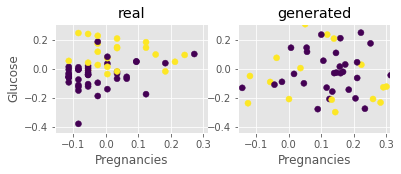

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.6886, 0.6949, 0.6841
D Real - D Gen: -0.0108


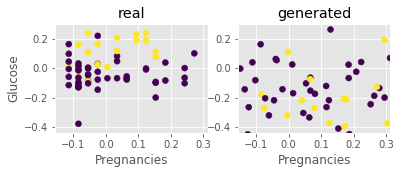

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.6899, 0.6943, 0.6831
D Real - D Gen: -0.0112


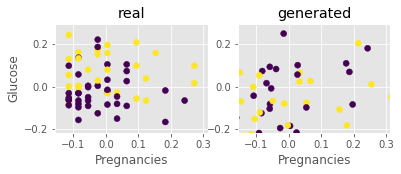

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.7021, 0.6778, 0.6786
D Real - D Gen: 0.0008


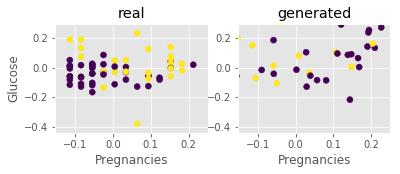

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.7042, 0.6845, 0.6825
D Real - D Gen: -0.0020


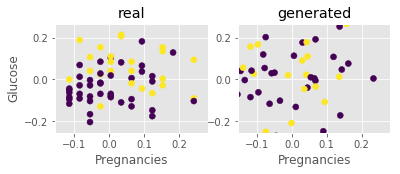

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.7125, 0.6722, 0.6859
D Real - D Gen: 0.0137


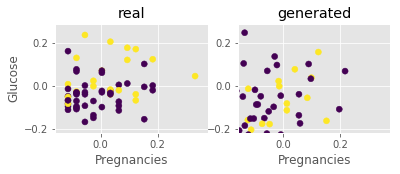

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.7132, 0.6749, 0.6913
D Real - D Gen: 0.0164


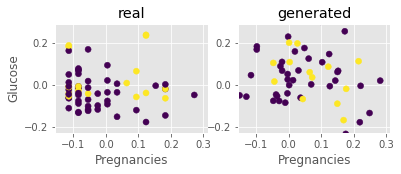

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.7122, 0.6787, 0.6805
D Real - D Gen: 0.0018


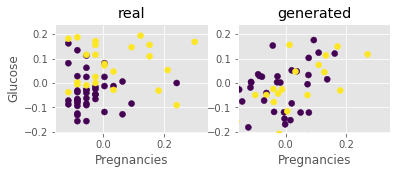

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.7010, 0.6849, 0.6851
D Real - D Gen: 0.0003


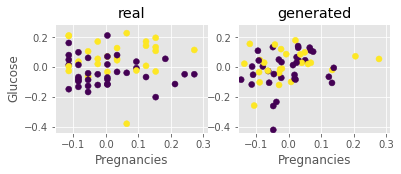

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.7046, 0.6840, 0.6835
D Real - D Gen: -0.0005


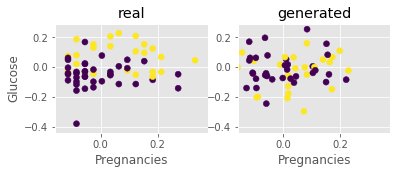

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.6998, 0.6833, 0.6858
D Real - D Gen: 0.0025


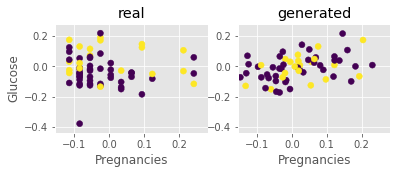

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.6964, 0.6809, 0.6836
D Real - D Gen: 0.0027


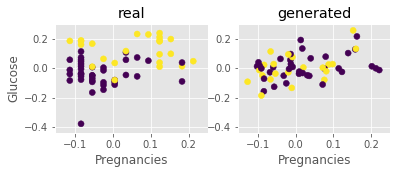

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.6962, 0.6895, 0.6831
D Real - D Gen: -0.0064


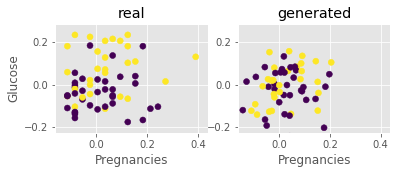

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6974, 0.6854
D Real - D Gen: -0.0120


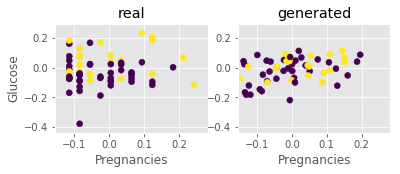

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.6796, 0.6915, 0.6762
D Real - D Gen: -0.0153


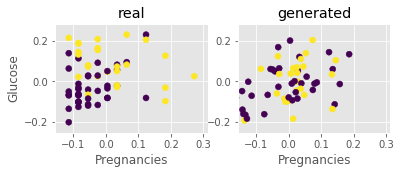

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.6894, 0.6948, 0.6884
D Real - D Gen: -0.0064


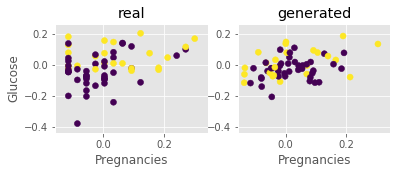

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.6937, 0.6946, 0.6724
D Real - D Gen: -0.0222


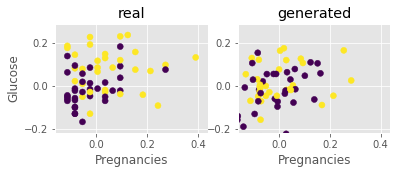

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.6995, 0.6904, 0.6750
D Real - D Gen: -0.0155


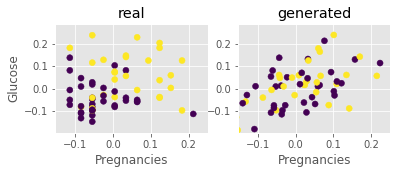

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.6906, 0.6916, 0.6843
D Real - D Gen: -0.0073


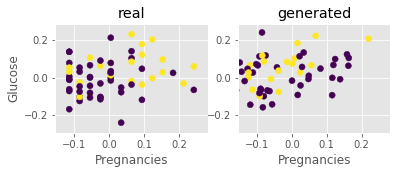

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 0.6890, 0.6916, 0.6794
D Real - D Gen: -0.0121


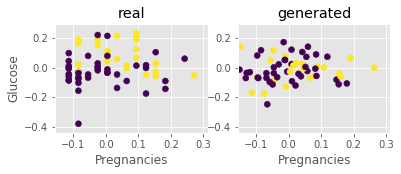

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.6911, 0.6955, 0.6811
D Real - D Gen: -0.0144


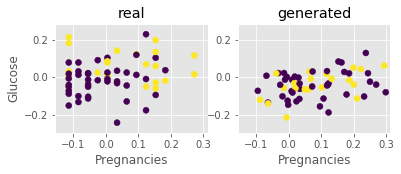

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.6831, 0.7022, 0.6658
D Real - D Gen: -0.0363


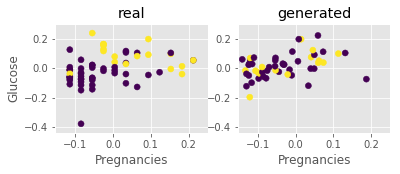

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.6695, 0.7080, 0.6628
D Real - D Gen: -0.0452


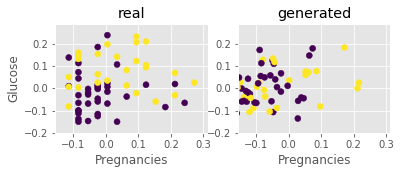

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.6873, 0.6924, 0.6728
D Real - D Gen: -0.0196


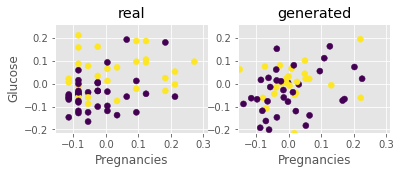

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.6668, 0.7286, 0.6625
D Real - D Gen: -0.0661


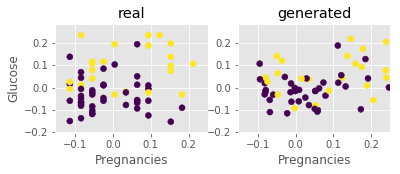

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.6920, 0.6794, 0.6605
D Real - D Gen: -0.0189


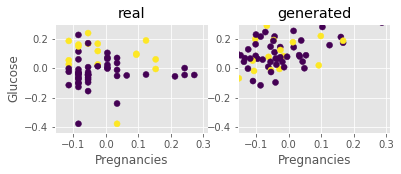

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 0.6734, 0.7095, 0.6685
D Real - D Gen: -0.0411


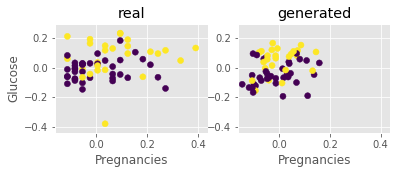

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 0.6955, 0.7140, 0.6658
D Real - D Gen: -0.0482


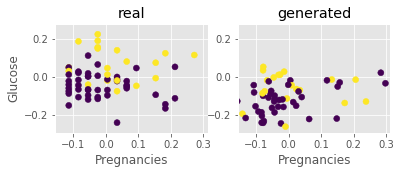

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 0.7005, 0.6924, 0.6799
D Real - D Gen: -0.0125


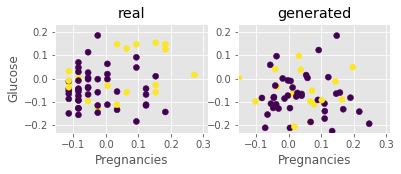

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.6872, 0.7063, 0.6788
D Real - D Gen: -0.0276


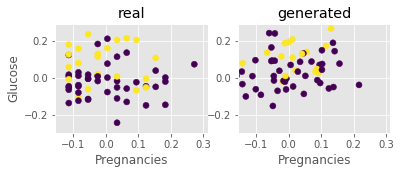

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.7179, 0.7022, 0.6711
D Real - D Gen: -0.0311


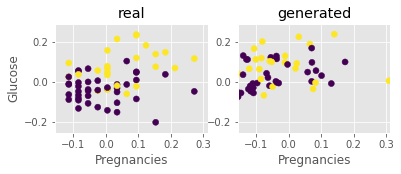

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.6754, 0.7040, 0.6682
D Real - D Gen: -0.0357


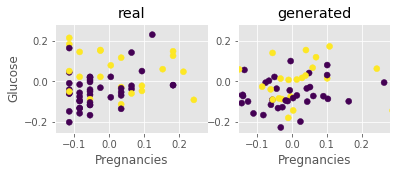

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 0.6823, 0.7057, 0.6691
D Real - D Gen: -0.0366


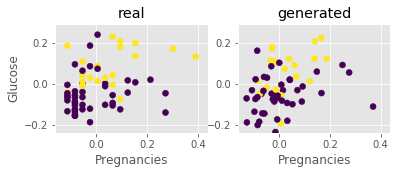

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 0.7125, 0.6672, 0.6721
D Real - D Gen: 0.0049


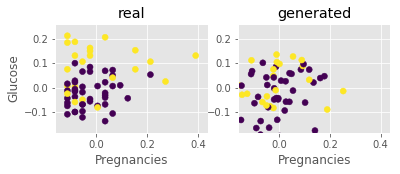

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 0.6727, 0.7055, 0.6739
D Real - D Gen: -0.0316


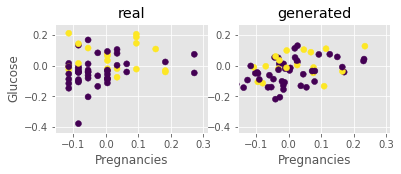

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 0.6776, 0.7107, 0.6640
D Real - D Gen: -0.0467


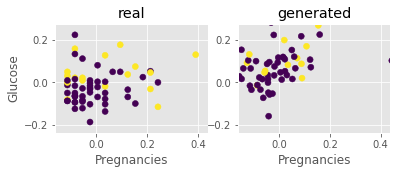

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.6984, 0.6969, 0.6576
D Real - D Gen: -0.0394


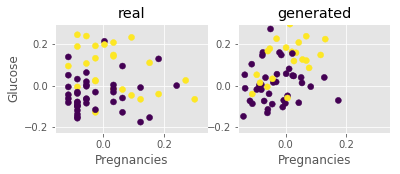

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.6601, 0.7280, 0.6631
D Real - D Gen: -0.0650


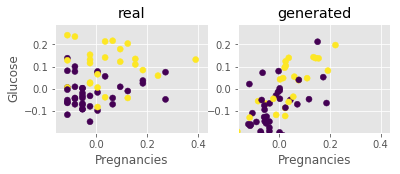

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.6833, 0.6879, 0.6650
D Real - D Gen: -0.0229


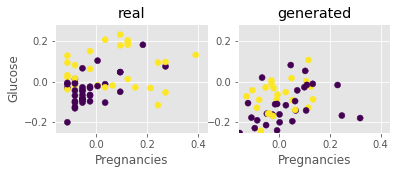

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.7169, 0.6818, 0.6576
D Real - D Gen: -0.0242


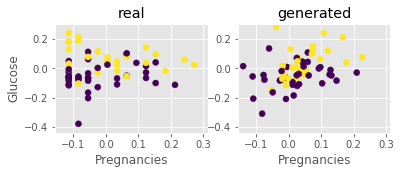

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.6438, 0.7429, 0.6511
D Real - D Gen: -0.0918


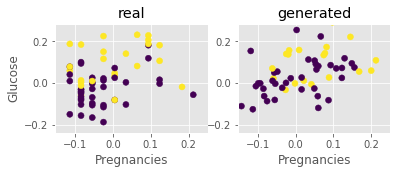

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.6599, 0.7337, 0.6640
D Real - D Gen: -0.0697


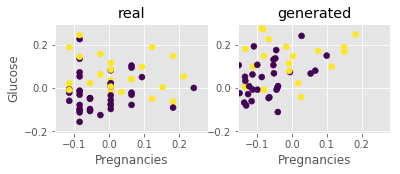

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.7255, 0.6736, 0.6573
D Real - D Gen: -0.0162


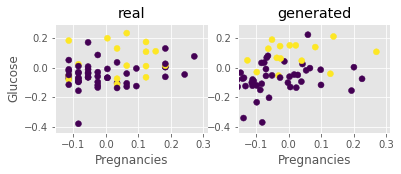

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.7027, 0.6829, 0.6617
D Real - D Gen: -0.0213


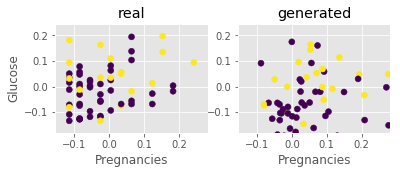

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.6199, 0.7581, 0.6564
D Real - D Gen: -0.1017


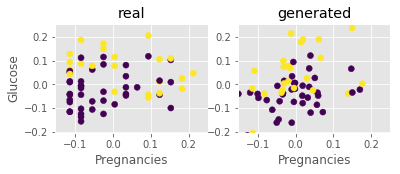

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.6383, 0.7686, 0.6501
D Real - D Gen: -0.1186


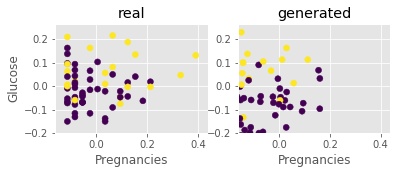

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.7077, 0.6536
D Real - D Gen: -0.0541


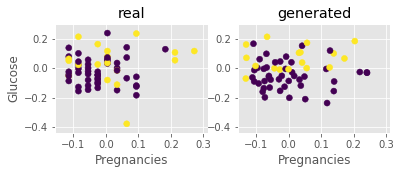

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.6809, 0.7008, 0.6643
D Real - D Gen: -0.0364


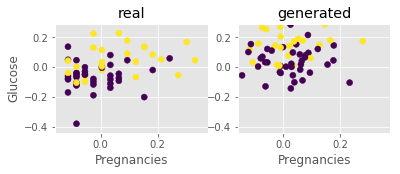

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.6481, 0.7451, 0.6532
D Real - D Gen: -0.0919


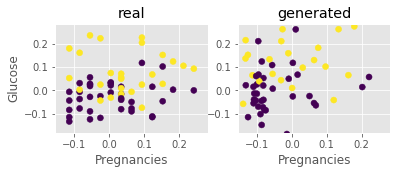

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.6436, 0.7507, 0.6599
D Real - D Gen: -0.0908


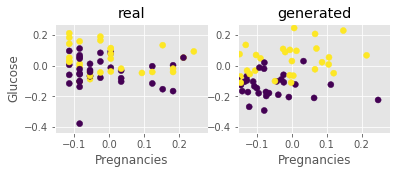

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6926, 0.6546
D Real - D Gen: -0.0380


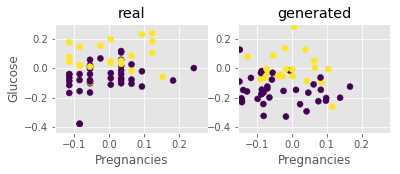

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.6725, 0.7176, 0.6566
D Real - D Gen: -0.0610


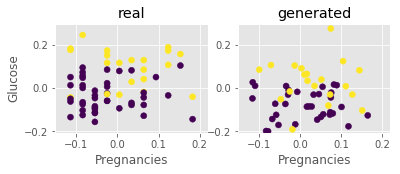

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.6608, 0.7274, 0.6653
D Real - D Gen: -0.0621


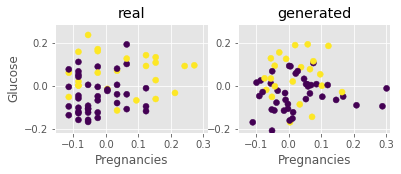

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.6541, 0.7219, 0.6575
D Real - D Gen: -0.0644


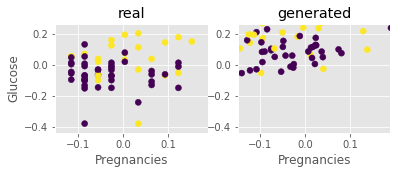

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.6715, 0.7208, 0.6579
D Real - D Gen: -0.0629


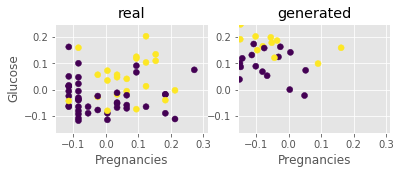

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.6855, 0.7026, 0.6625
D Real - D Gen: -0.0401


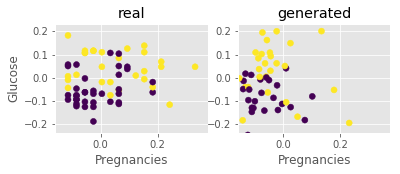

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.6568, 0.7288, 0.6708
D Real - D Gen: -0.0580


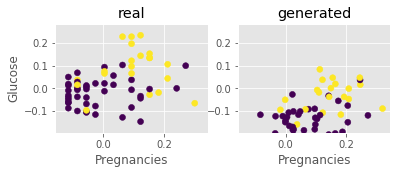

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.6780, 0.7064, 0.6620
D Real - D Gen: -0.0444


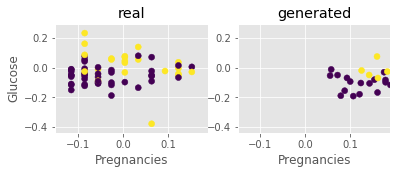

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.6680, 0.7218, 0.6572
D Real - D Gen: -0.0646


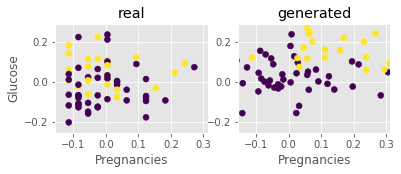

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.6489, 0.7422, 0.6567
D Real - D Gen: -0.0855


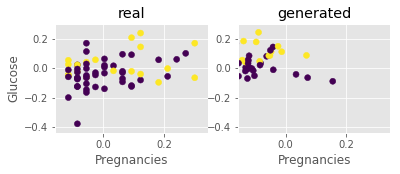

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.6727, 0.7096, 0.6661
D Real - D Gen: -0.0435


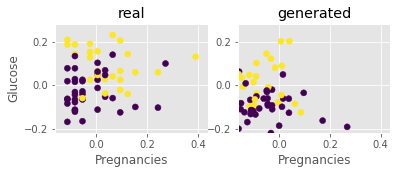

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.6660, 0.7214, 0.6652
D Real - D Gen: -0.0562


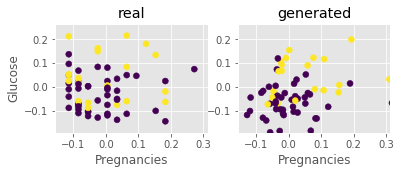

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.6735, 0.7135, 0.6679
D Real - D Gen: -0.0456


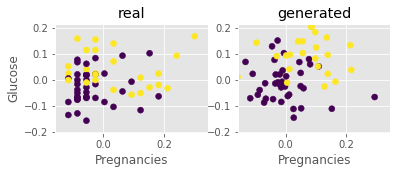

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.6667, 0.7194, 0.6662
D Real - D Gen: -0.0531


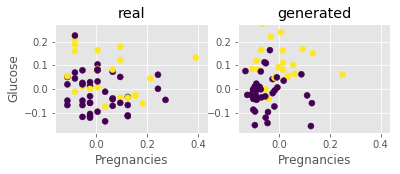

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.6697, 0.7168, 0.6664
D Real - D Gen: -0.0504


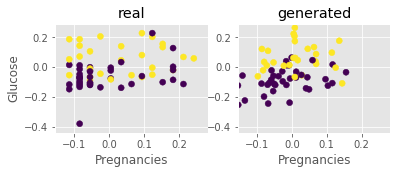

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.6812, 0.7039, 0.6761
D Real - D Gen: -0.0279


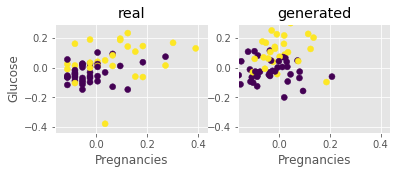

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.6794, 0.7089, 0.6731
D Real - D Gen: -0.0358


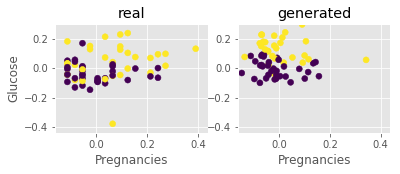

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.6895, 0.7022, 0.6703
D Real - D Gen: -0.0319


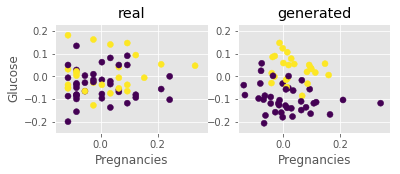

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.6511, 0.7393, 0.6630
D Real - D Gen: -0.0763


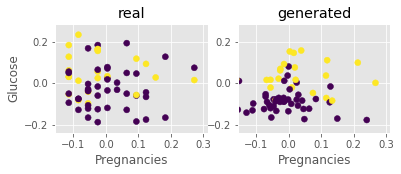

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.6760, 0.7072, 0.6632
D Real - D Gen: -0.0440


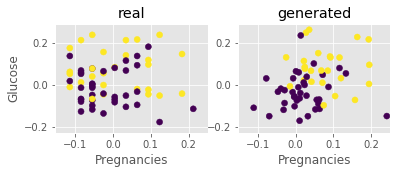

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.7437, 0.6447, 0.6586
D Real - D Gen: 0.0139


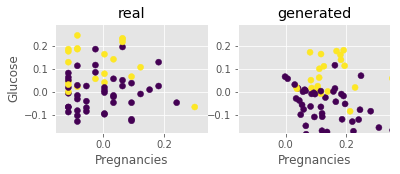

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.7127, 0.6853, 0.6572
D Real - D Gen: -0.0281


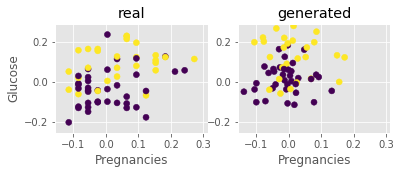

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.6326, 0.7595, 0.6367
D Real - D Gen: -0.1228


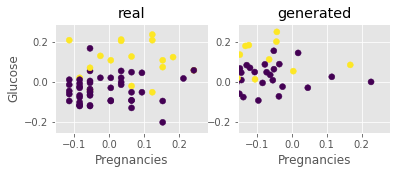

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.6101, 0.7853, 0.6317
D Real - D Gen: -0.1537


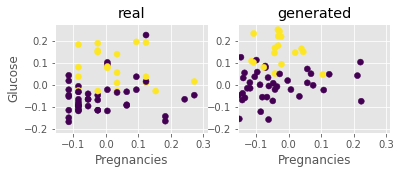

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.6543, 0.7351, 0.6330
D Real - D Gen: -0.1021


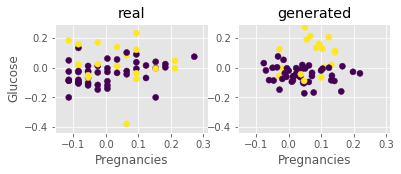

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.6763, 0.7210, 0.6490
D Real - D Gen: -0.0721


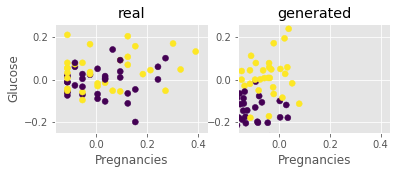

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.6829, 0.7081, 0.6443
D Real - D Gen: -0.0638


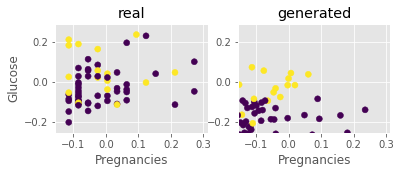

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.6353, 0.7502, 0.6579
D Real - D Gen: -0.0924


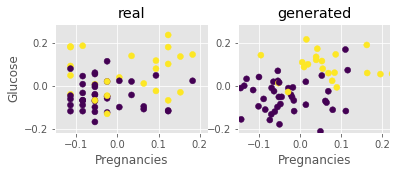

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.6509, 0.7377, 0.6467
D Real - D Gen: -0.0909


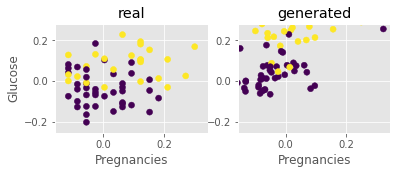

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.6594, 0.7239, 0.6547
D Real - D Gen: -0.0692


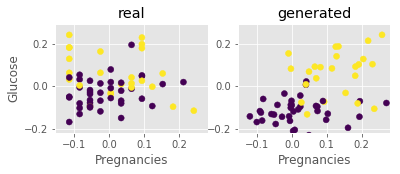

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.6817, 0.7068, 0.6693
D Real - D Gen: -0.0374


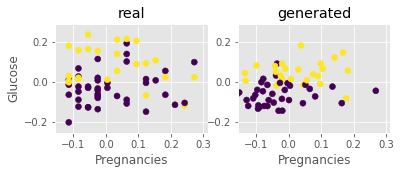

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 0.6732, 0.7159, 0.6683
D Real - D Gen: -0.0476


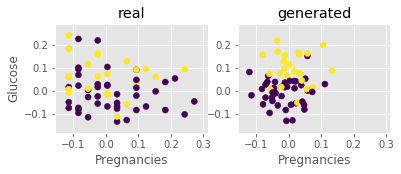

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.6705, 0.7135, 0.6720
D Real - D Gen: -0.0415


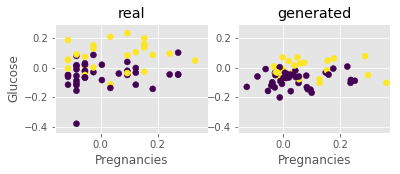

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.7132, 0.6711
D Real - D Gen: -0.0421


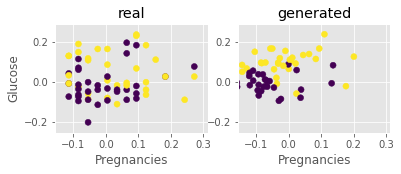

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.6699, 0.7175, 0.6622
D Real - D Gen: -0.0552


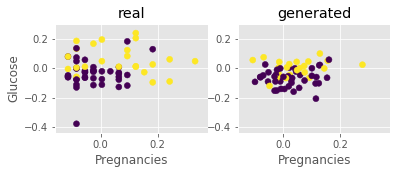

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 0.6708, 0.7188, 0.6625
D Real - D Gen: -0.0563


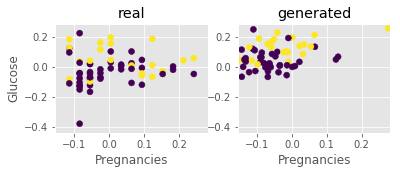

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.6616, 0.7279, 0.6635
D Real - D Gen: -0.0644


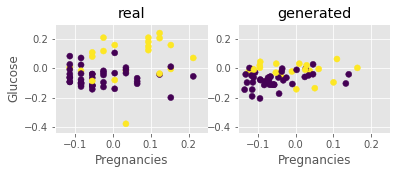

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.7163, 0.6644
D Real - D Gen: -0.0519


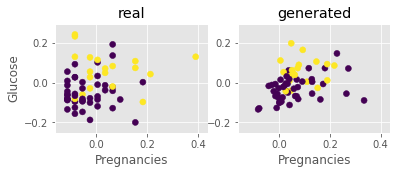

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.6634, 0.7258, 0.6628
D Real - D Gen: -0.0629


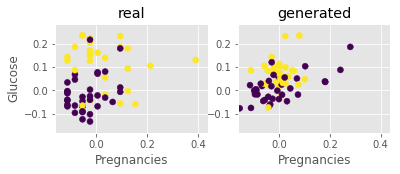

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 0.6865, 0.7021, 0.6639
D Real - D Gen: -0.0382


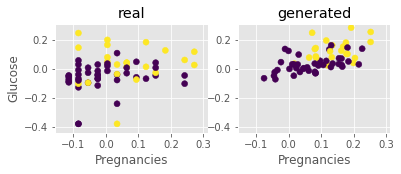

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.6766, 0.7087, 0.6543
D Real - D Gen: -0.0545


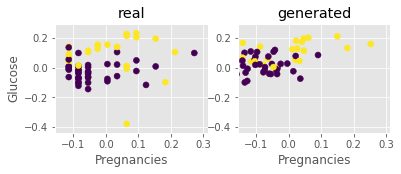

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.6325, 0.7693, 0.6408
D Real - D Gen: -0.1284


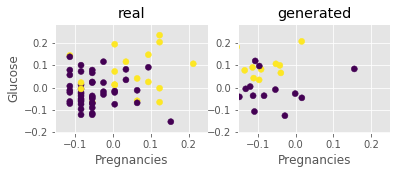

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.6710, 0.7140, 0.6588
D Real - D Gen: -0.0552


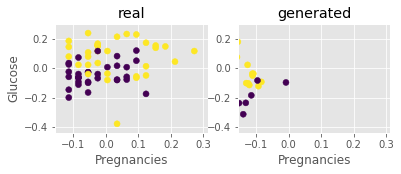

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 0.7031, 0.6787, 0.6488
D Real - D Gen: -0.0299


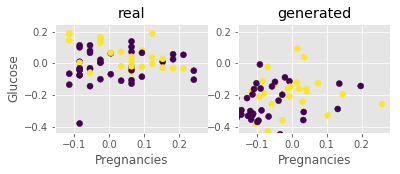

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.7251, 0.6626, 0.6604
D Real - D Gen: -0.0021


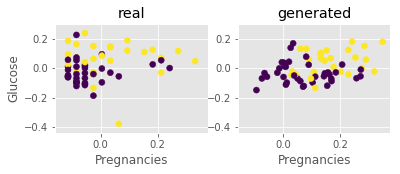

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.7406, 0.6565, 0.6530
D Real - D Gen: -0.0035


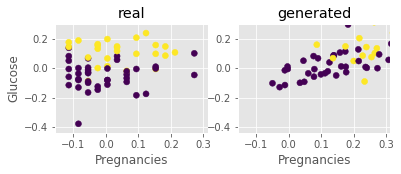

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.6655, 0.7298, 0.6562
D Real - D Gen: -0.0737


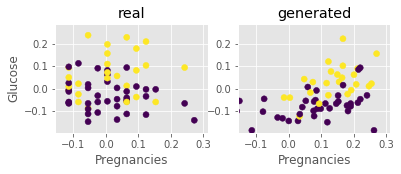

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.6255, 0.7658, 0.6326
D Real - D Gen: -0.1332


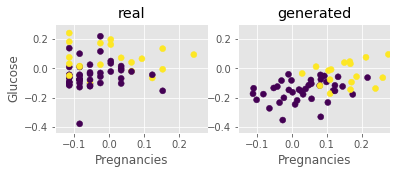

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.6304, 0.7604, 0.6436
D Real - D Gen: -0.1169


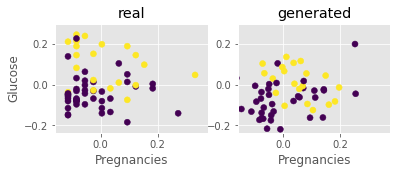

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.6607, 0.7294, 0.6524
D Real - D Gen: -0.0770


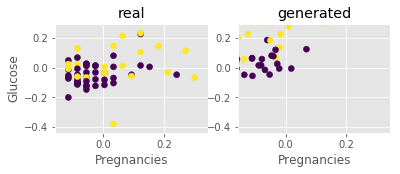

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.6665, 0.7218, 0.6547
D Real - D Gen: -0.0671


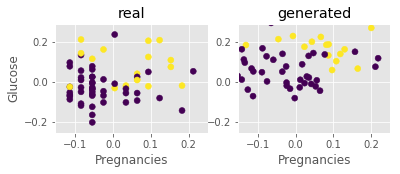

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.6670, 0.7215, 0.6575
D Real - D Gen: -0.0640


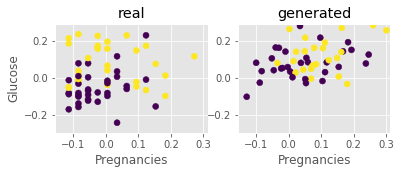

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.6452, 0.7434, 0.6569
D Real - D Gen: -0.0865


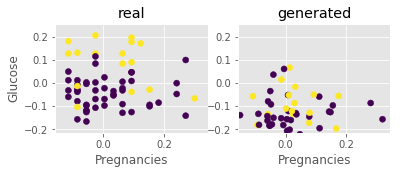

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.6870, 0.6979, 0.6694
D Real - D Gen: -0.0285


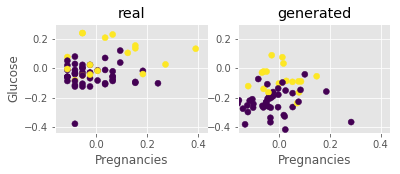

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.6549, 0.7309, 0.6614
D Real - D Gen: -0.0695


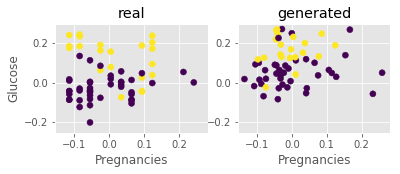

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 0.6661, 0.7196, 0.6528
D Real - D Gen: -0.0668


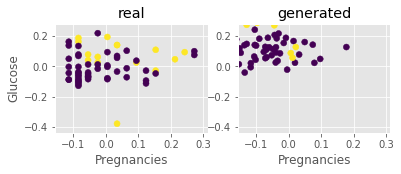

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.6487, 0.7382, 0.6549
D Real - D Gen: -0.0833


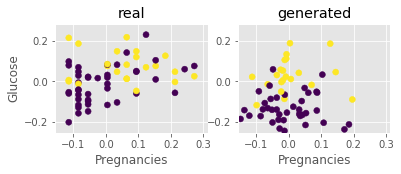

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.6674, 0.7177, 0.6633
D Real - D Gen: -0.0544


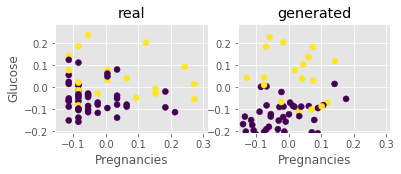

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.6723, 0.7131, 0.6691
D Real - D Gen: -0.0440


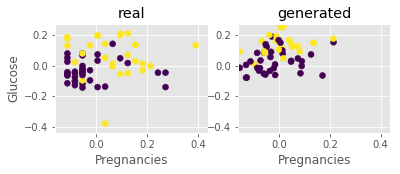

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.6731, 0.7107, 0.6700
D Real - D Gen: -0.0407


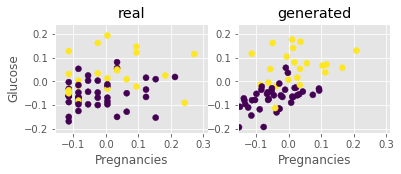

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.6741, 0.7121, 0.6660
D Real - D Gen: -0.0461


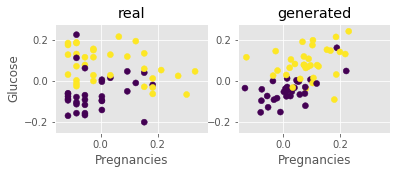

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.6820, 0.7068, 0.6663
D Real - D Gen: -0.0405


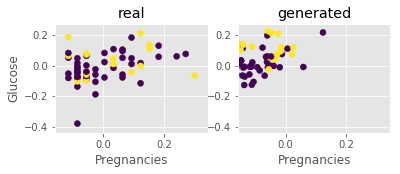

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.6678, 0.7213, 0.6732
D Real - D Gen: -0.0481


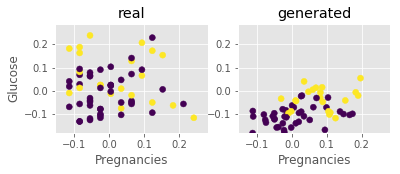

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 0.6731, 0.7138, 0.6711
D Real - D Gen: -0.0427


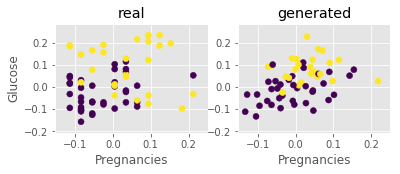

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 0.6831, 0.7029, 0.6774
D Real - D Gen: -0.0255


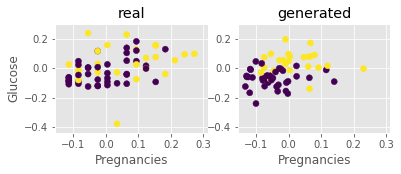

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.6854, 0.6991, 0.6809
D Real - D Gen: -0.0182


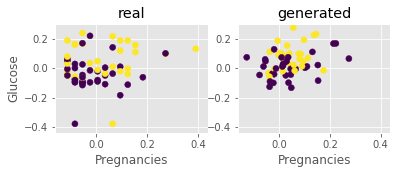

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.6803, 0.7038, 0.6749
D Real - D Gen: -0.0289


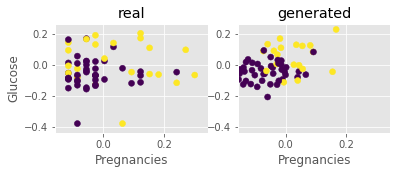

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.6839, 0.7007, 0.6789
D Real - D Gen: -0.0219


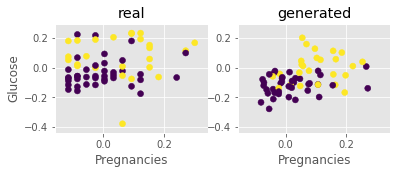

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.6819, 0.7033, 0.6780
D Real - D Gen: -0.0253


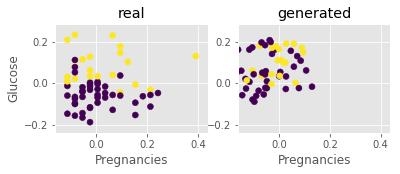

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.6859, 0.7017, 0.6825
D Real - D Gen: -0.0192


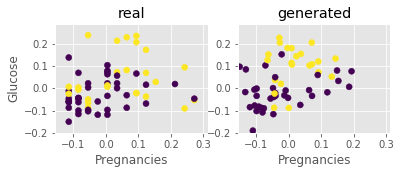

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.6858, 0.6978, 0.6790
D Real - D Gen: -0.0188


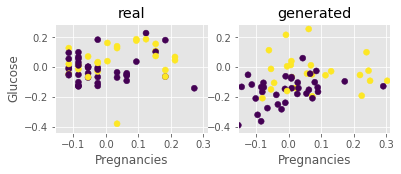

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.6957, 0.7007, 0.6822
D Real - D Gen: -0.0185


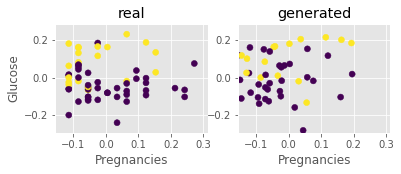

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.8299, 0.5713, 0.6858
D Real - D Gen: 0.1145


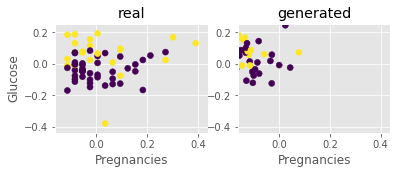

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 0.8453, 0.5831, 0.6509
D Real - D Gen: 0.0678


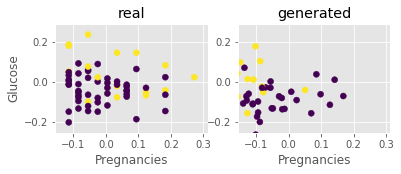

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.6377, 0.7556, 0.6683
D Real - D Gen: -0.0874


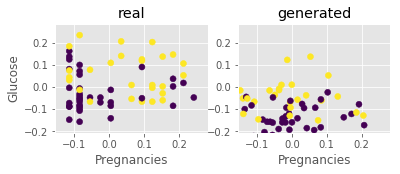

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.6355, 0.7544, 0.6464
D Real - D Gen: -0.1080


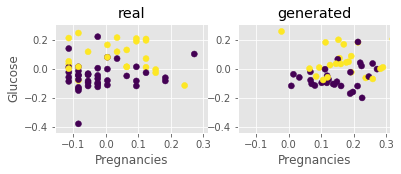

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 0.6640, 0.7257, 0.6281
D Real - D Gen: -0.0976


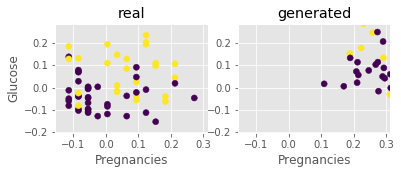

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.7420, 0.6199
D Real - D Gen: -0.1221


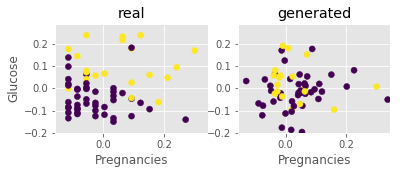

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 0.6151, 0.7933, 0.6510
D Real - D Gen: -0.1423


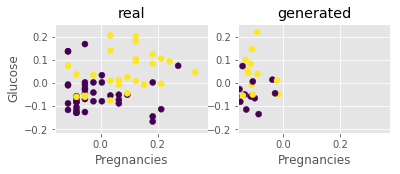

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.6964, 0.6902, 0.6595
D Real - D Gen: -0.0306


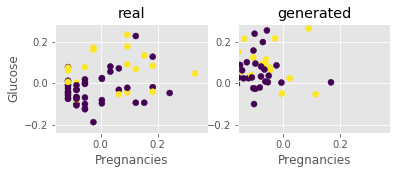

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 0.7584, 0.6253, 0.6693
D Real - D Gen: 0.0440


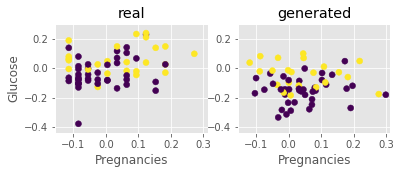

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.6674, 0.7340, 0.6636
D Real - D Gen: -0.0704


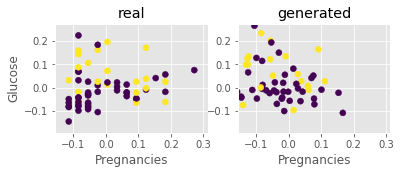

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.6586, 0.7282, 0.6537
D Real - D Gen: -0.0745


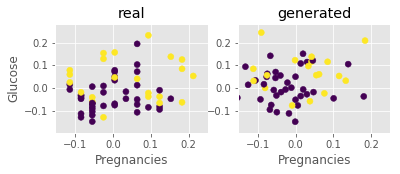

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.6683, 0.7148, 0.6677
D Real - D Gen: -0.0471


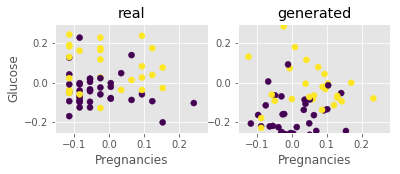

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.6657, 0.7208, 0.6720
D Real - D Gen: -0.0488


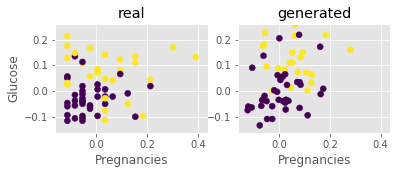

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.6659, 0.7200, 0.6643
D Real - D Gen: -0.0556


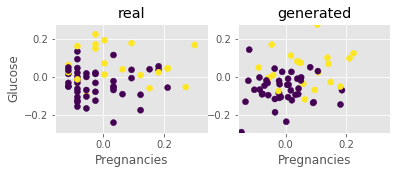

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 0.6717, 0.7135, 0.6672
D Real - D Gen: -0.0462


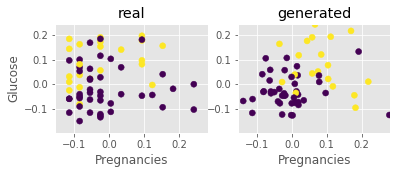

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.6718, 0.7146, 0.6678
D Real - D Gen: -0.0468


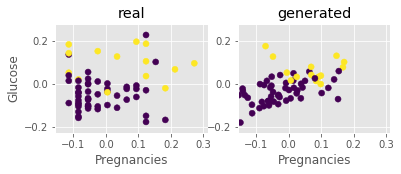

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 0.6786, 0.7096, 0.6704
D Real - D Gen: -0.0392


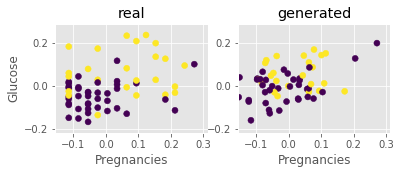

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.7153, 0.6662, 0.6723
D Real - D Gen: 0.0061


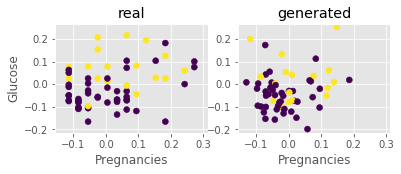

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 0.6672, 0.7166, 0.6796
D Real - D Gen: -0.0370


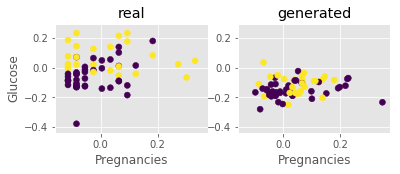

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 0.6614, 0.7196, 0.6611
D Real - D Gen: -0.0585


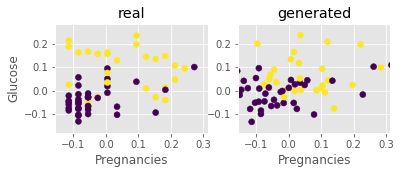

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 0.6640, 0.7197, 0.6602
D Real - D Gen: -0.0595


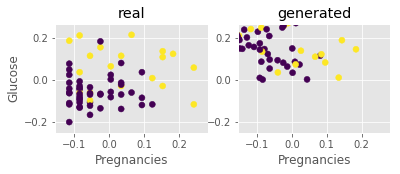

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 0.6763, 0.7120, 0.6677
D Real - D Gen: -0.0443


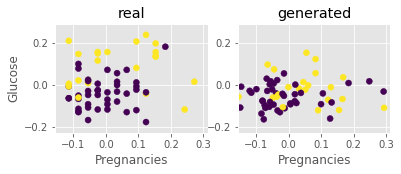

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.6702, 0.7189, 0.6654
D Real - D Gen: -0.0535


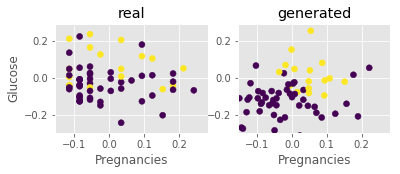

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.6742, 0.7108, 0.6735
D Real - D Gen: -0.0373


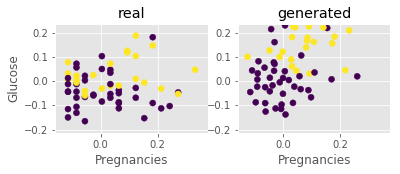

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.6680, 0.7236, 0.6756
D Real - D Gen: -0.0479


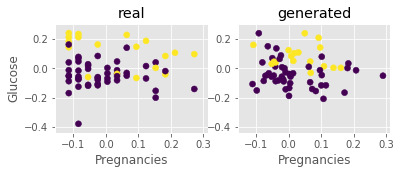

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 0.7393, 0.6529, 0.6856
D Real - D Gen: 0.0328


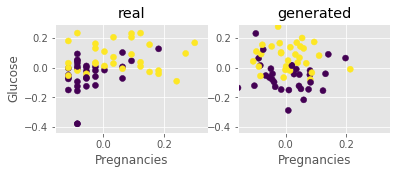

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 0.9889, 0.4713, 0.6771
D Real - D Gen: 0.2058


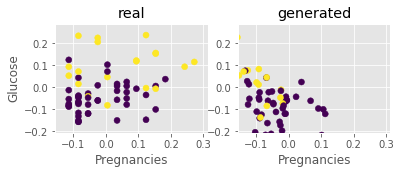

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 0.8295, 0.5476, 0.6469
D Real - D Gen: 0.0993


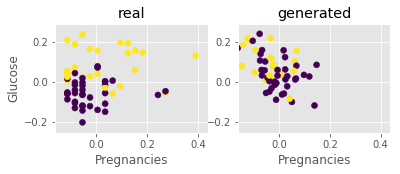

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 0.5807, 0.8266, 0.6257
D Real - D Gen: -0.2010


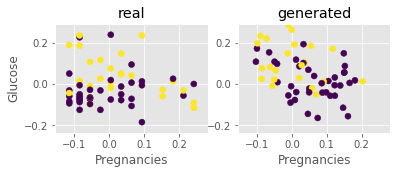

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.5979, 0.7978, 0.5970
D Real - D Gen: -0.2008


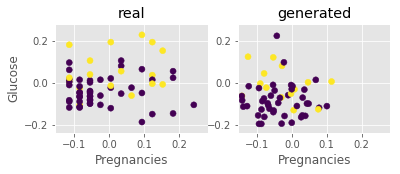

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 0.6518, 0.7346, 0.6164
D Real - D Gen: -0.1182


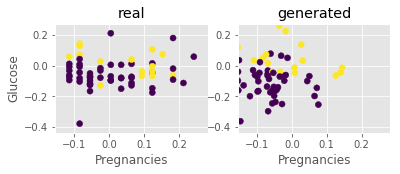

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 0.6276, 0.7650, 0.6461
D Real - D Gen: -0.1189


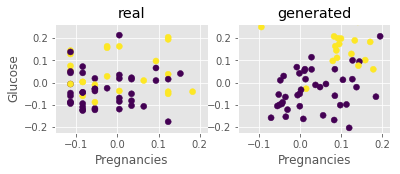

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 0.6578, 0.7390, 0.6514
D Real - D Gen: -0.0877


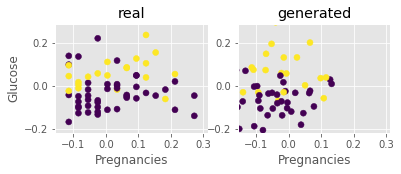

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.6567, 0.7314, 0.6580
D Real - D Gen: -0.0735


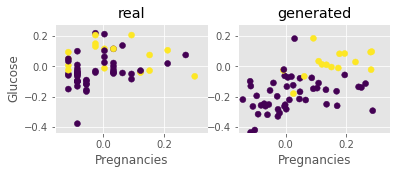

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 0.6554, 0.7322, 0.6576
D Real - D Gen: -0.0746


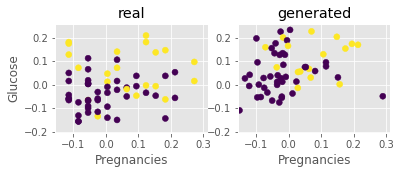

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 0.6649, 0.7208, 0.6645
D Real - D Gen: -0.0562


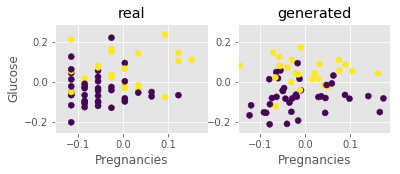

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 0.6729, 0.7180, 0.6698
D Real - D Gen: -0.0482


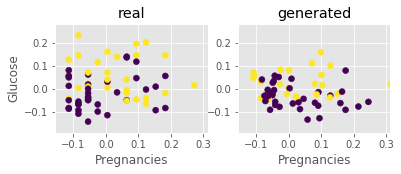

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 0.6733, 0.7144, 0.6688
D Real - D Gen: -0.0455


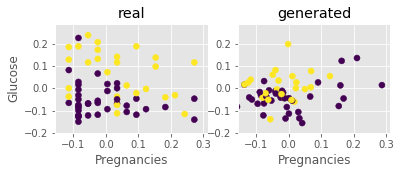

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 0.6683, 0.7130, 0.6667
D Real - D Gen: -0.0463


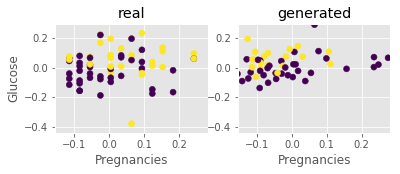

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 0.7152, 0.6723, 0.6580
D Real - D Gen: -0.0143


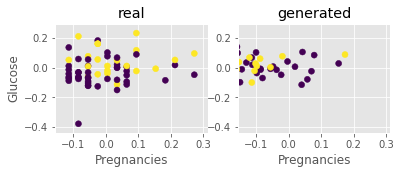

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 0.8354, 0.5787, 0.6607
D Real - D Gen: 0.0820


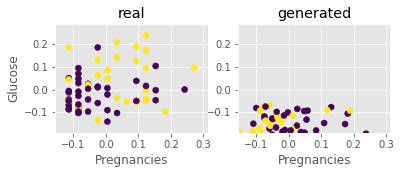

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 0.7046, 0.6807, 0.6705
D Real - D Gen: -0.0102


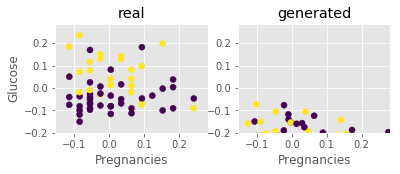

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 0.6525, 0.7389, 0.6627
D Real - D Gen: -0.0762


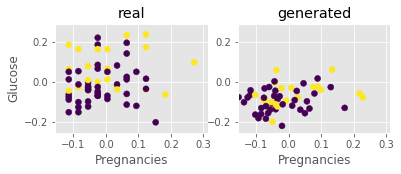

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 0.6531, 0.7317, 0.6616
D Real - D Gen: -0.0701


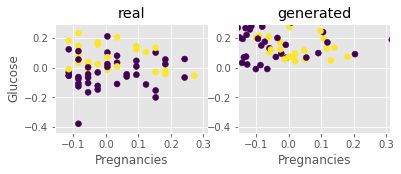

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 0.6705, 0.7166, 0.6623
D Real - D Gen: -0.0544


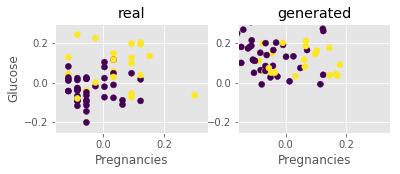

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 0.6668, 0.7188, 0.6706
D Real - D Gen: -0.0482


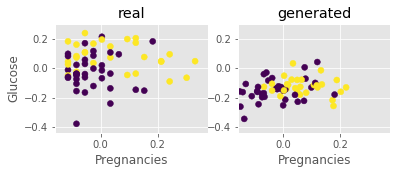

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 0.6748, 0.7138, 0.6708
D Real - D Gen: -0.0430


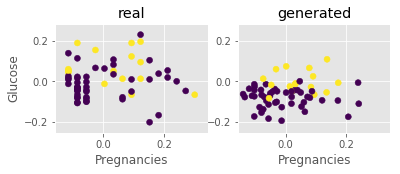

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 0.6758, 0.7106, 0.6755
D Real - D Gen: -0.0351


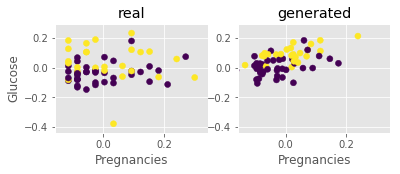

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 0.6718, 0.7125, 0.6779
D Real - D Gen: -0.0346


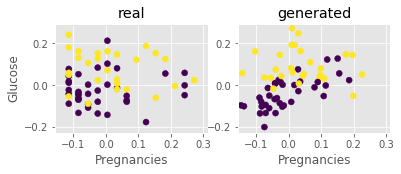

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 0.6700, 0.7131, 0.6724
D Real - D Gen: -0.0407


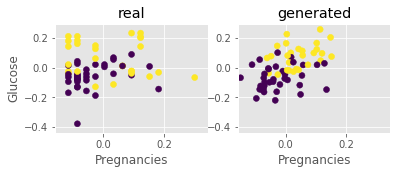

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 0.6738, 0.7106, 0.6740
D Real - D Gen: -0.0366


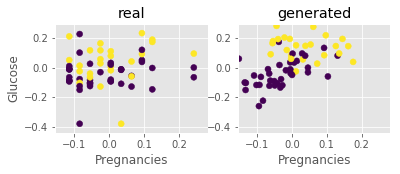

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 0.6777, 0.7059, 0.6752
D Real - D Gen: -0.0307


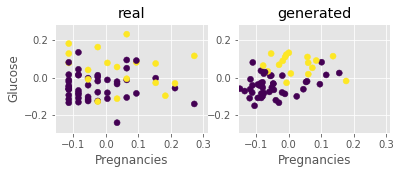

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 0.6780, 0.7092, 0.6728
D Real - D Gen: -0.0364


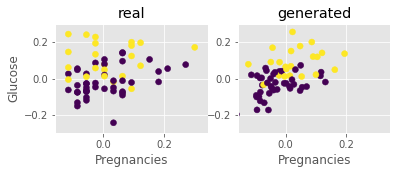

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 0.6780, 0.7088, 0.6743
D Real - D Gen: -0.0345


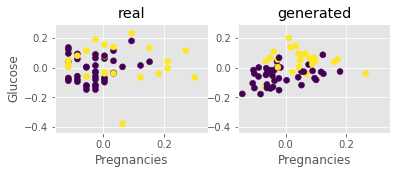

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 0.6765, 0.7090, 0.6788
D Real - D Gen: -0.0302


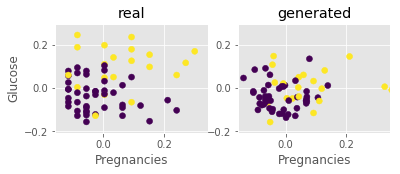

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 0.7017, 0.6871, 0.6685
D Real - D Gen: -0.0186


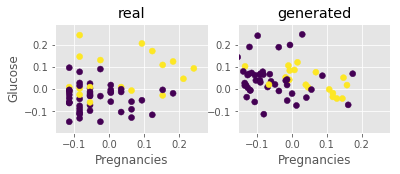

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 0.6864, 0.6946, 0.6834
D Real - D Gen: -0.0112


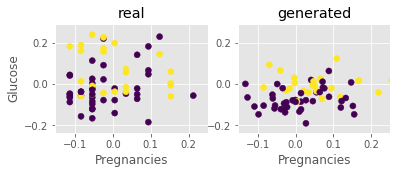

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 0.6769, 0.7115, 0.6780
D Real - D Gen: -0.0334


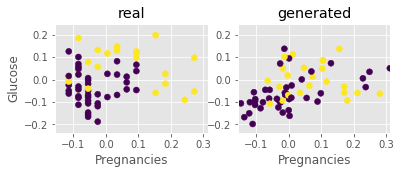

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 0.6810, 0.7024, 0.6818
D Real - D Gen: -0.0206


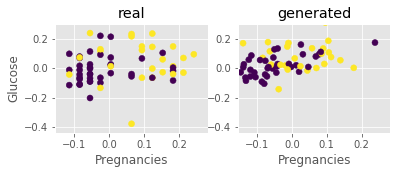

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 0.6874, 0.6942, 0.6833
D Real - D Gen: -0.0109


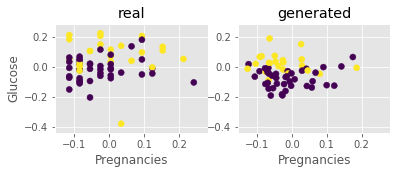

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 0.6864, 0.7014, 0.6827
D Real - D Gen: -0.0187


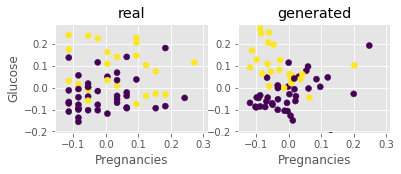

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 0.6855, 0.7047, 0.6766
D Real - D Gen: -0.0280


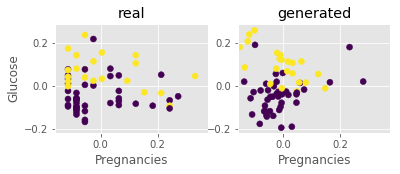

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 0.6909, 0.6919, 0.6844
D Real - D Gen: -0.0076


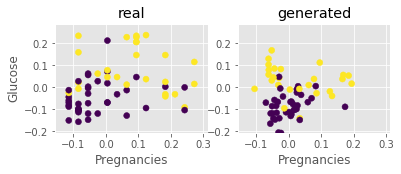

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 0.6850, 0.7029, 0.6836
D Real - D Gen: -0.0193


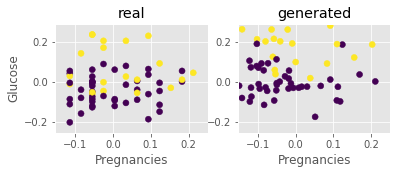

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 0.6824, 0.7022, 0.6780
D Real - D Gen: -0.0242


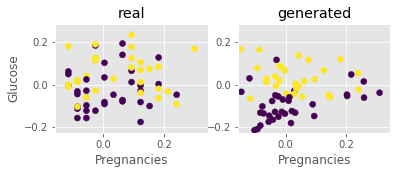

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 0.6965, 0.6950, 0.6844
D Real - D Gen: -0.0106


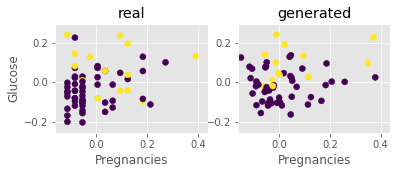

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 0.6813, 0.7001, 0.6780
D Real - D Gen: -0.0221


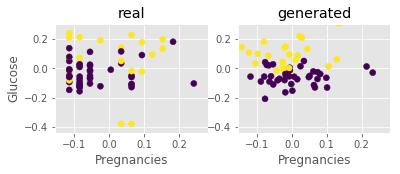

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 0.6880, 0.7005, 0.6842
D Real - D Gen: -0.0163


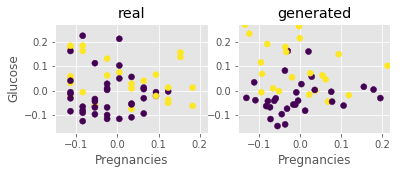

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 0.6952, 0.6939, 0.6859
D Real - D Gen: -0.0079


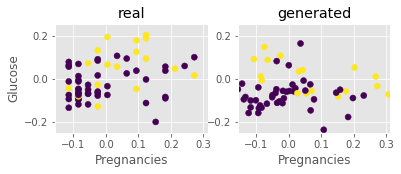

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 0.6895, 0.6938, 0.6902
D Real - D Gen: -0.0036


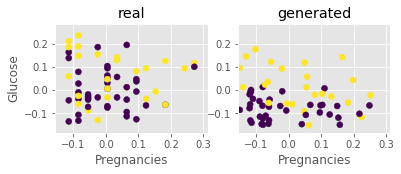

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 0.6912, 0.6947, 0.6853
D Real - D Gen: -0.0093


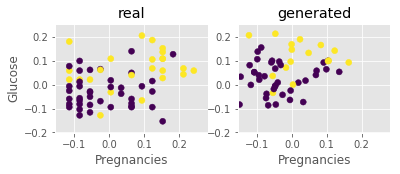

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 0.6928, 0.6979, 0.6874
D Real - D Gen: -0.0106


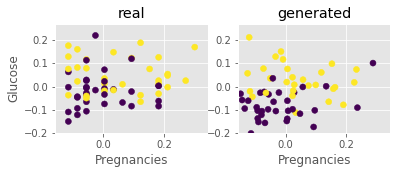

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 0.6882, 0.6964, 0.6854
D Real - D Gen: -0.0110


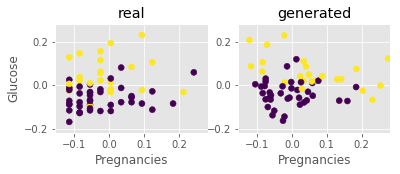

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 0.6937, 0.6944, 0.6887
D Real - D Gen: -0.0057


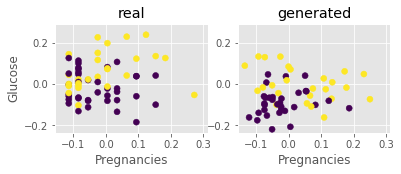

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 0.6908, 0.6953, 0.6894
D Real - D Gen: -0.0059


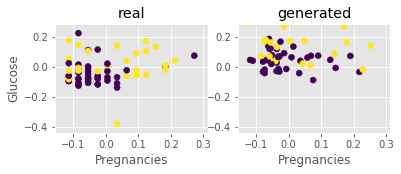

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 0.6997, 0.6822, 0.6936
D Real - D Gen: 0.0114


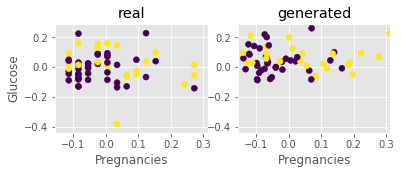

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 0.6956, 0.6927, 0.6893
D Real - D Gen: -0.0034


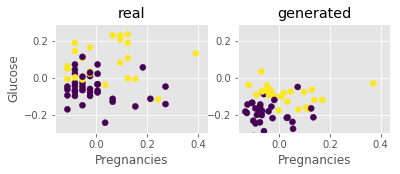

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 0.7033, 0.6841, 0.6790
D Real - D Gen: -0.0050


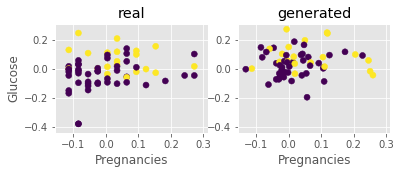

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 0.8031, 0.5996, 0.6737
D Real - D Gen: 0.0742


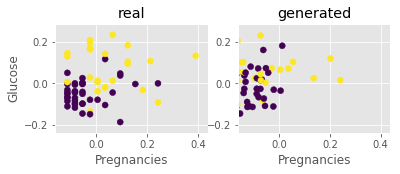

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 0.8048, 0.5987, 0.6730
D Real - D Gen: 0.0743


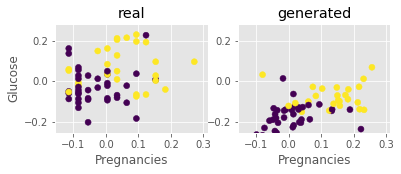

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 0.6556, 0.7299, 0.6732
D Real - D Gen: -0.0567


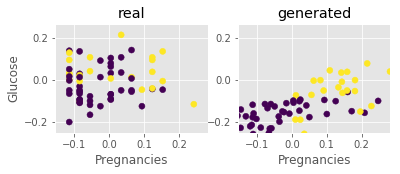

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 0.6669, 0.7190, 0.6628
D Real - D Gen: -0.0563


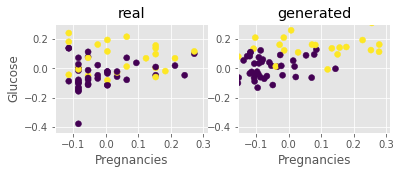

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 0.6626, 0.7256, 0.6632
D Real - D Gen: -0.0624


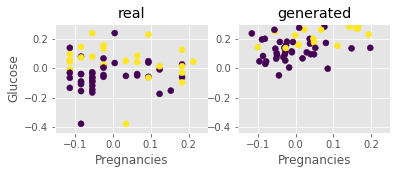

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 0.6730, 0.7111, 0.6758
D Real - D Gen: -0.0353


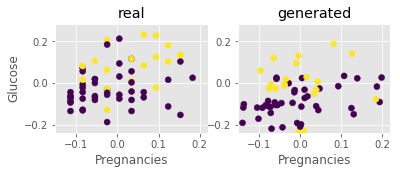

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 0.6828, 0.7036, 0.6827
D Real - D Gen: -0.0209


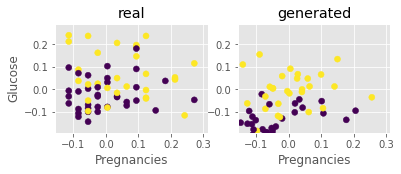

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 0.6783, 0.7107, 0.6760
D Real - D Gen: -0.0347


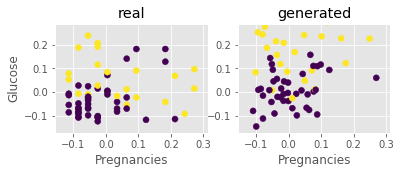

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 0.6772, 0.7042, 0.6781
D Real - D Gen: -0.0261


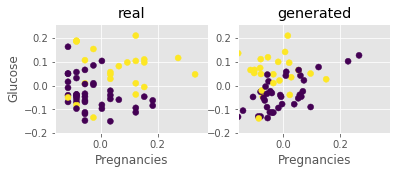

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 0.6837, 0.6986, 0.6822
D Real - D Gen: -0.0163


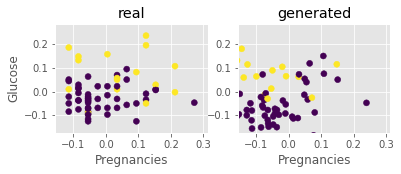

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 0.6850, 0.6979, 0.6820
D Real - D Gen: -0.0159


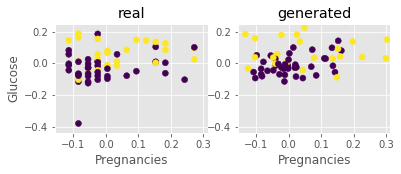

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 0.6886, 0.6962, 0.6849
D Real - D Gen: -0.0113


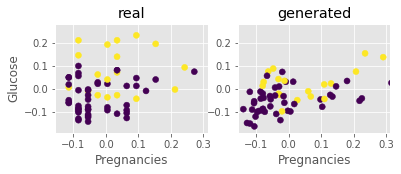

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 0.6912, 0.6965, 0.6871
D Real - D Gen: -0.0094


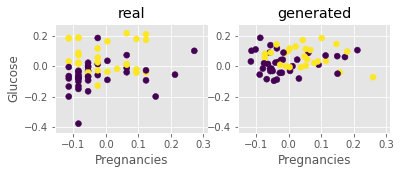

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 0.6886, 0.6968, 0.6855
D Real - D Gen: -0.0113


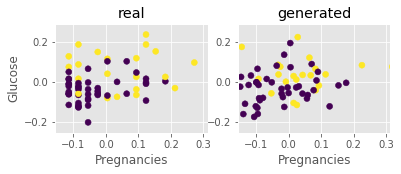

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 0.6916, 0.6945, 0.6866
D Real - D Gen: -0.0078


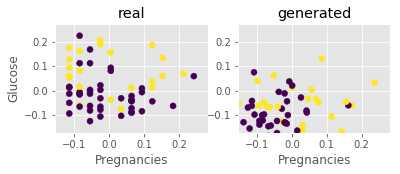

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 0.6880, 0.7008, 0.6854
D Real - D Gen: -0.0154


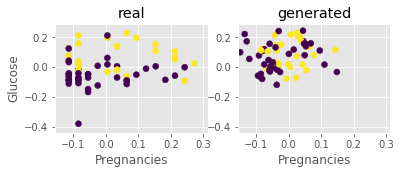

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 0.6901, 0.6986, 0.6865
D Real - D Gen: -0.0121


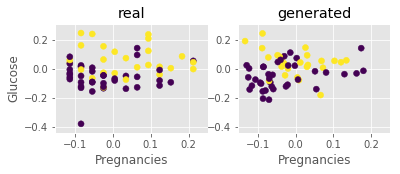

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 0.6866, 0.6955, 0.6835
D Real - D Gen: -0.0121


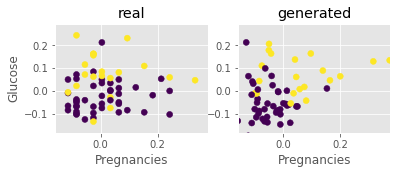

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 0.6916, 0.6959, 0.6870
D Real - D Gen: -0.0090


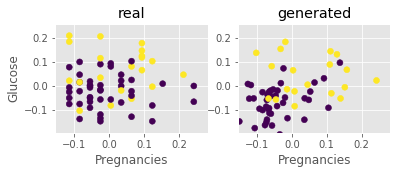

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 0.6928, 0.6949, 0.6850
D Real - D Gen: -0.0098


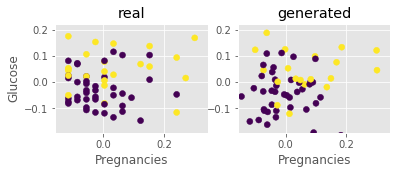

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 0.6910, 0.6926, 0.6883
D Real - D Gen: -0.0043


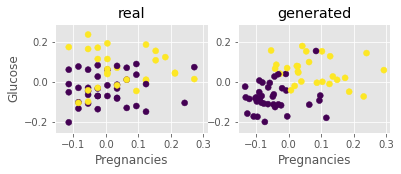

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 0.7010, 0.6877, 0.6851
D Real - D Gen: -0.0025


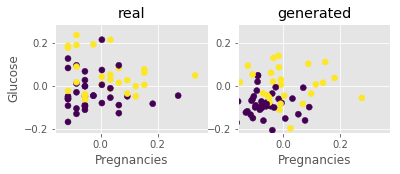

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 0.6891, 0.7011, 0.6882
D Real - D Gen: -0.0129


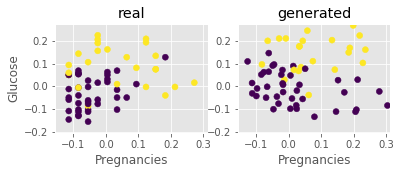

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 0.6908, 0.6918, 0.6897
D Real - D Gen: -0.0021


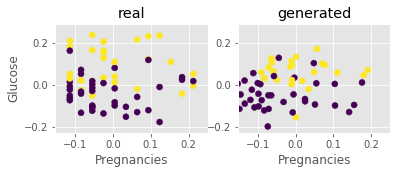

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 0.6913, 0.6937, 0.6818
D Real - D Gen: -0.0119


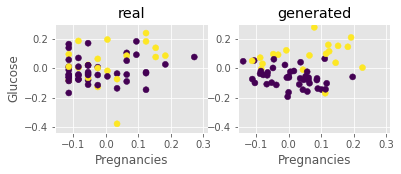

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 0.6953, 0.6933, 0.6857
D Real - D Gen: -0.0076


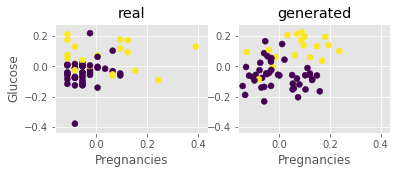

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 0.6869, 0.6947, 0.6831
D Real - D Gen: -0.0116


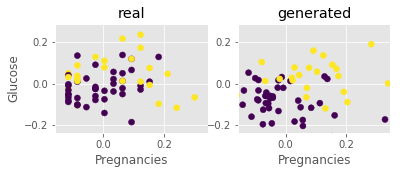

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 0.6968, 0.6920, 0.6903
D Real - D Gen: -0.0016


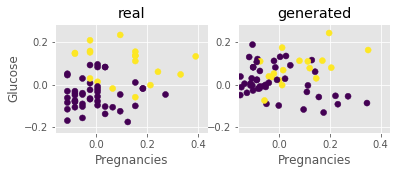

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 0.6943, 0.6947, 0.6873
D Real - D Gen: -0.0074


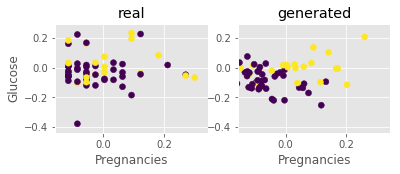

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6924, 0.6868
D Real - D Gen: -0.0056


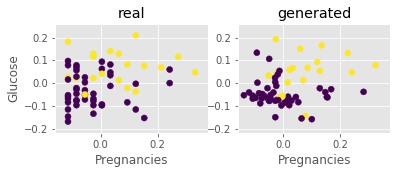

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 0.6931, 0.6964, 0.6833
D Real - D Gen: -0.0131


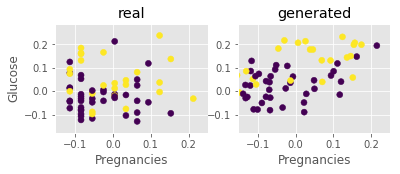

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 0.6934, 0.6923, 0.6908
D Real - D Gen: -0.0015


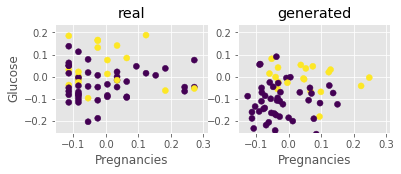

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 0.6942, 0.6909, 0.6890
D Real - D Gen: -0.0019


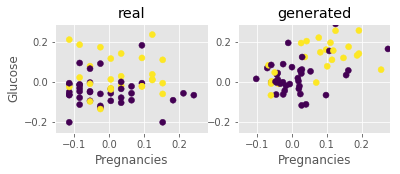

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 0.6943, 0.6916, 0.6882
D Real - D Gen: -0.0034


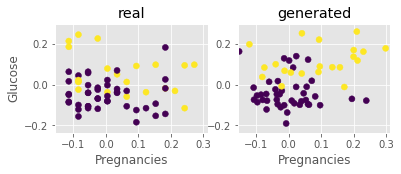

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 0.6974, 0.6899, 0.6881
D Real - D Gen: -0.0018


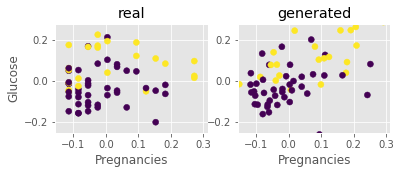

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 0.6941, 0.6932, 0.6863
D Real - D Gen: -0.0069


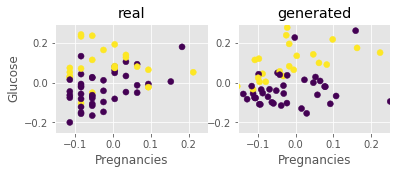

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 0.6975, 0.6891, 0.6951
D Real - D Gen: 0.0060


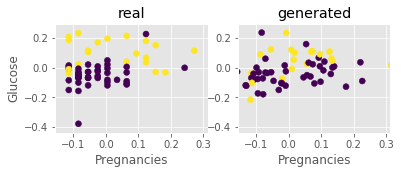

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6858, 0.6878
D Real - D Gen: 0.0019


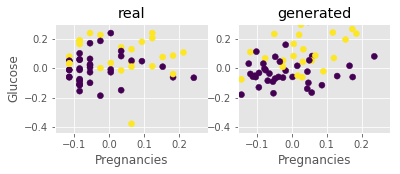

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 0.6967, 0.6898, 0.6891
D Real - D Gen: -0.0007


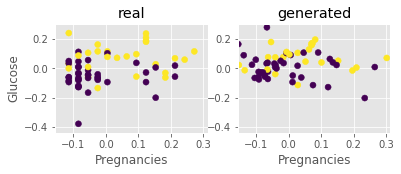

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 0.6905, 0.6908, 0.6870
D Real - D Gen: -0.0038


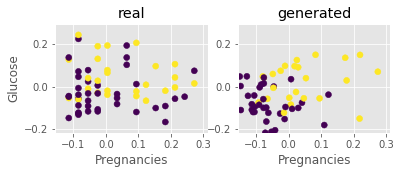

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 0.6959, 0.6880, 0.6921
D Real - D Gen: 0.0042


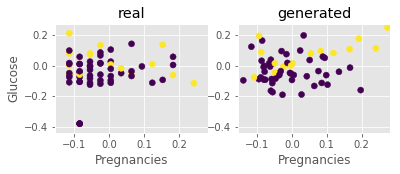

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 0.6973, 0.6902, 0.6900
D Real - D Gen: -0.0002


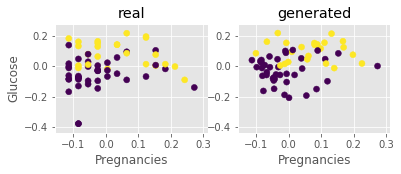

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 0.6938, 0.6889, 0.6896
D Real - D Gen: 0.0007


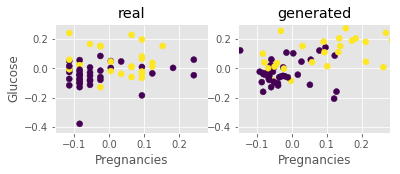

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 0.6917, 0.6878, 0.6851
D Real - D Gen: -0.0027


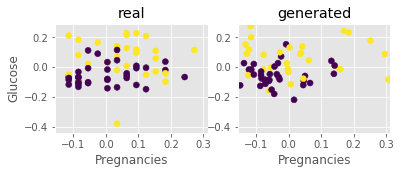

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 0.6981, 0.6900, 0.6918
D Real - D Gen: 0.0019


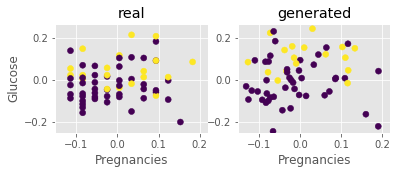

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 0.6941, 0.6895, 0.6921
D Real - D Gen: 0.0026


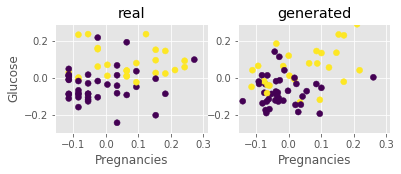

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 0.7000, 0.6891, 0.6880
D Real - D Gen: -0.0011


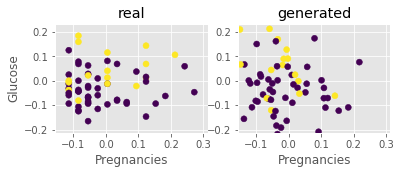

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6904, 0.6863
D Real - D Gen: -0.0042


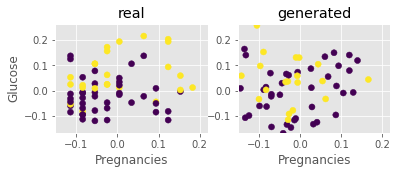

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 0.6973, 0.6827, 0.6921
D Real - D Gen: 0.0094


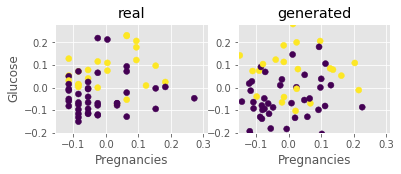

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 0.7012, 0.6886, 0.6903
D Real - D Gen: 0.0018


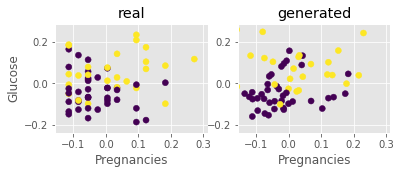

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 0.6996, 0.6886, 0.6850
D Real - D Gen: -0.0037


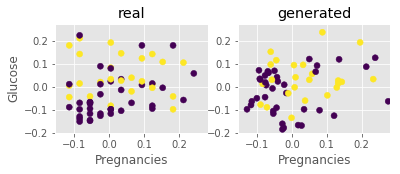

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 0.6943, 0.6865, 0.6923
D Real - D Gen: 0.0058


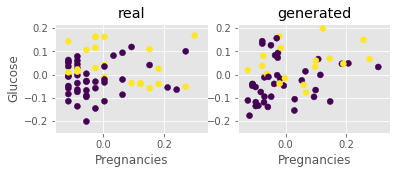

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6892, 0.6903
D Real - D Gen: 0.0011


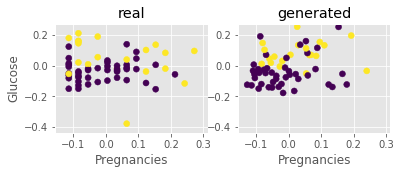

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 0.6955, 0.6864, 0.6918
D Real - D Gen: 0.0054


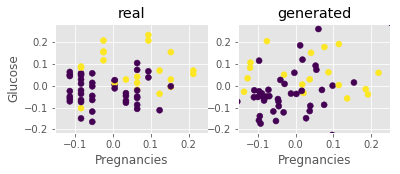

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 0.6921, 0.6882, 0.6875
D Real - D Gen: -0.0006


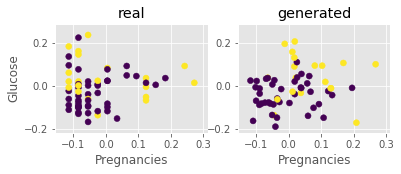

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 0.6995, 0.6877, 0.6930
D Real - D Gen: 0.0052


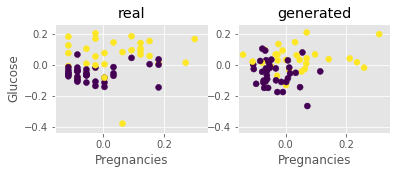

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 0.6993, 0.6847, 0.6942
D Real - D Gen: 0.0096


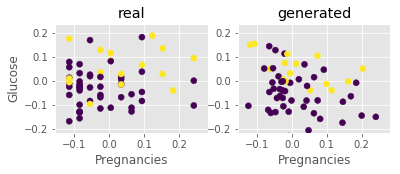

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 0.6991, 0.6864, 0.6905
D Real - D Gen: 0.0042


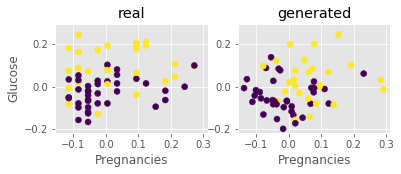

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 0.6970, 0.6837, 0.6891
D Real - D Gen: 0.0054


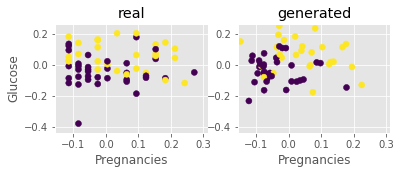

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 0.6999, 0.6887, 0.6958
D Real - D Gen: 0.0071


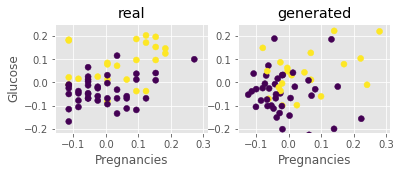

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 0.6913, 0.6945, 0.6866
D Real - D Gen: -0.0080


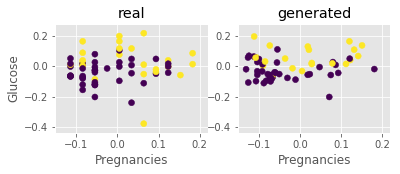

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 0.6958, 0.6873, 0.6898
D Real - D Gen: 0.0025


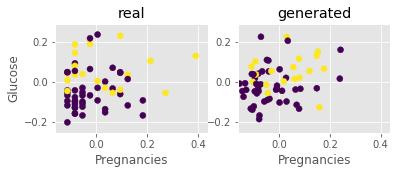

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6884, 0.6839
D Real - D Gen: -0.0045


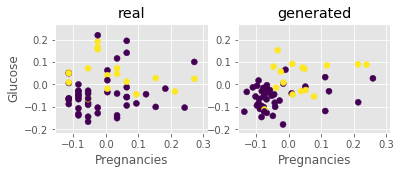

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 0.6990, 0.6878, 0.6865
D Real - D Gen: -0.0013


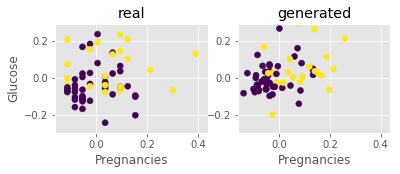

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 0.7020, 0.6813, 0.6910
D Real - D Gen: 0.0097


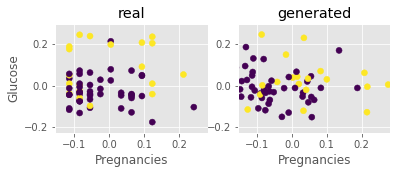

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 0.7021, 0.6849, 0.6938
D Real - D Gen: 0.0089


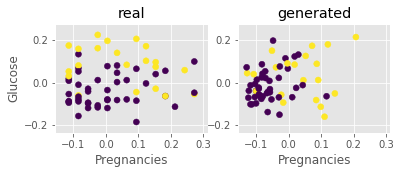

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6889, 0.6885
D Real - D Gen: -0.0003


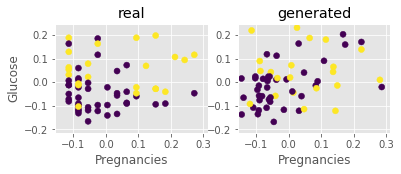

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 0.6978, 0.6883, 0.6863
D Real - D Gen: -0.0020


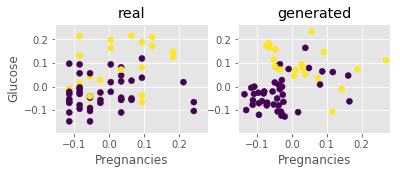

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 0.6897, 0.6858, 0.6880
D Real - D Gen: 0.0021


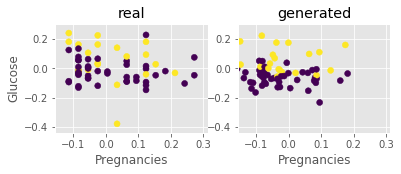

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 0.6990, 0.6854, 0.6871
D Real - D Gen: 0.0017


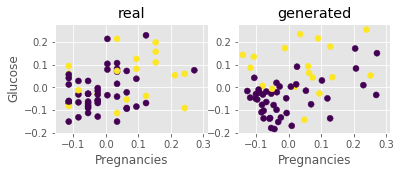

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 0.7011, 0.6896, 0.6884
D Real - D Gen: -0.0012


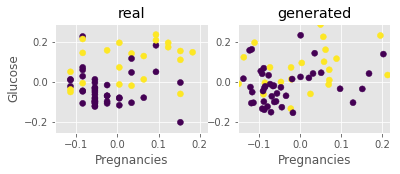

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 0.6938, 0.6851, 0.6908
D Real - D Gen: 0.0057


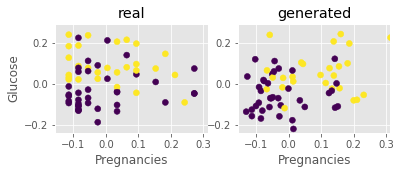

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 0.6952, 0.6803, 0.6904
D Real - D Gen: 0.0101


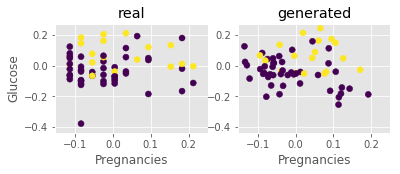

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 0.7017, 0.6863, 0.6912
D Real - D Gen: 0.0048


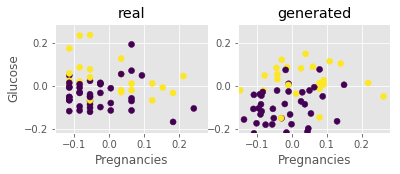

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6909, 0.6881
D Real - D Gen: -0.0028


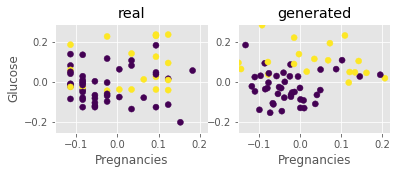

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 0.6929, 0.6921, 0.6814
D Real - D Gen: -0.0107


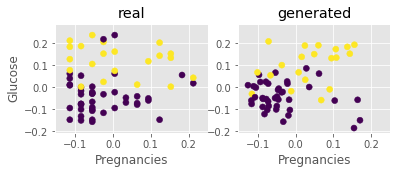

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 0.7039, 0.6878, 0.6888
D Real - D Gen: 0.0010


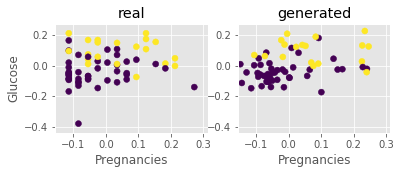

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 0.7004, 0.6922, 0.6863
D Real - D Gen: -0.0059


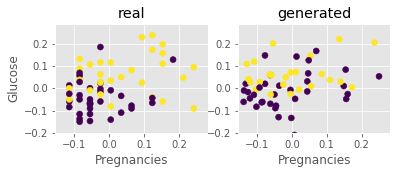

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 0.6971, 0.6873, 0.6845
D Real - D Gen: -0.0028


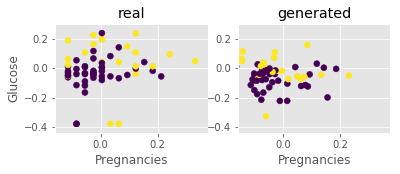

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 0.6977, 0.6884, 0.6865
D Real - D Gen: -0.0019


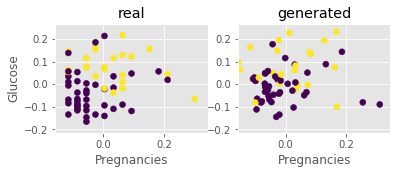

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 0.7015, 0.6851, 0.6894
D Real - D Gen: 0.0043


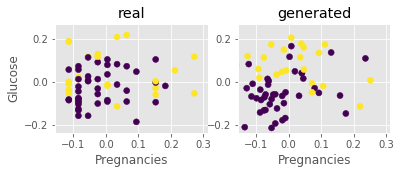

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 0.7000, 0.6834, 0.6857
D Real - D Gen: 0.0024


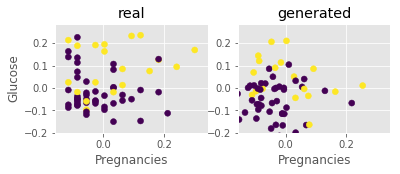

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 0.6990, 0.6909, 0.6871
D Real - D Gen: -0.0038


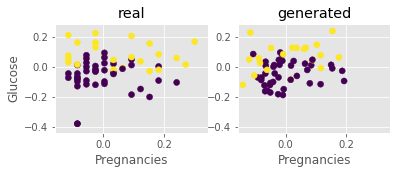

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 0.7034, 0.6881, 0.6904
D Real - D Gen: 0.0024


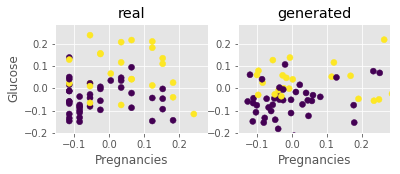

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 0.6977, 0.6883, 0.6894
D Real - D Gen: 0.0011


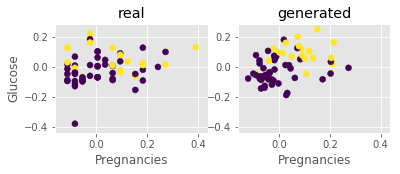

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 0.7009, 0.6881, 0.6886
D Real - D Gen: 0.0005


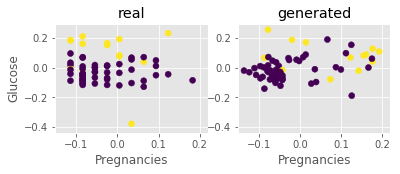

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 0.6988, 0.6870, 0.6883
D Real - D Gen: 0.0013


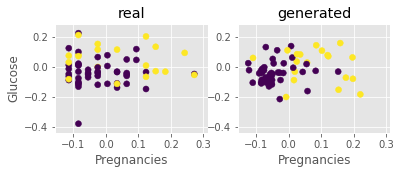

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 0.6942, 0.6927, 0.6894
D Real - D Gen: -0.0034


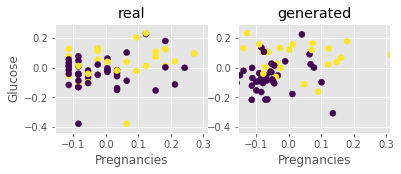

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 0.7030, 0.6883, 0.6838
D Real - D Gen: -0.0045


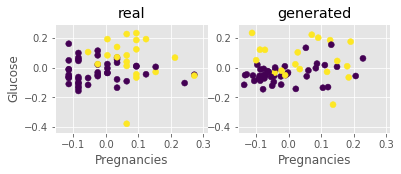

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 0.7011, 0.6887, 0.6843
D Real - D Gen: -0.0043


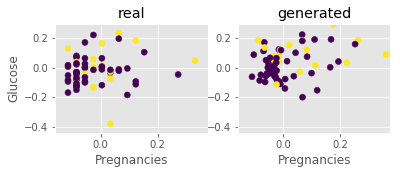

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 0.6955, 0.6892, 0.6886
D Real - D Gen: -0.0007


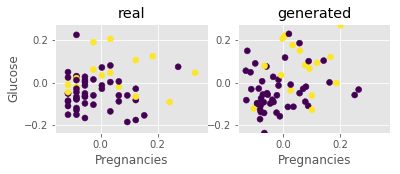

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 0.7001, 0.6857, 0.6907
D Real - D Gen: 0.0050


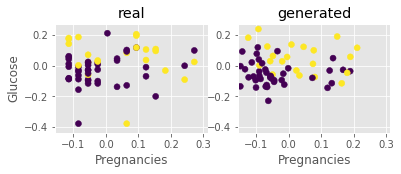

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 0.6938, 0.6867, 0.6913
D Real - D Gen: 0.0046


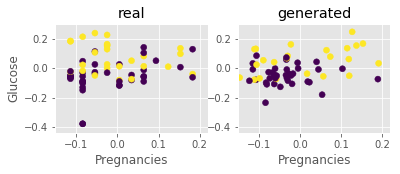

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 0.6976, 0.6801, 0.6937
D Real - D Gen: 0.0136


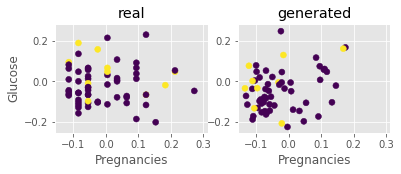

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 0.7050, 0.6808, 0.6935
D Real - D Gen: 0.0126


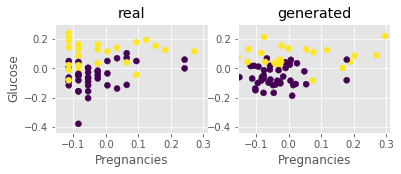

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 0.7007, 0.6783, 0.6864
D Real - D Gen: 0.0080


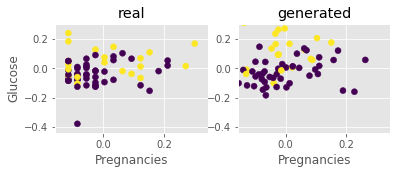

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 0.7018, 0.6783, 0.6934
D Real - D Gen: 0.0151


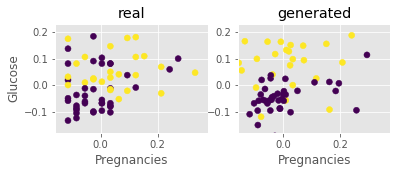

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6786, 0.6901
D Real - D Gen: 0.0115


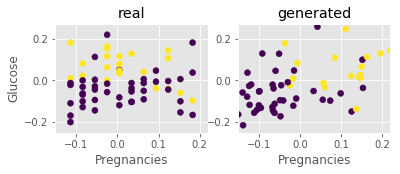

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 0.6961, 0.6881, 0.6850
D Real - D Gen: -0.0031


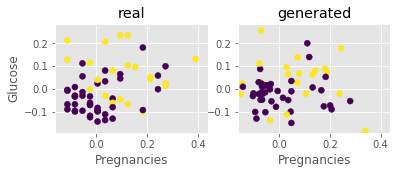

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6858, 0.6829
D Real - D Gen: -0.0029


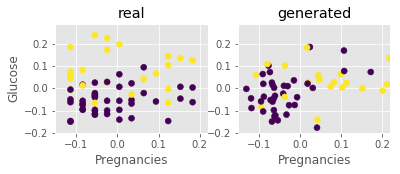

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 0.7057, 0.6858, 0.6917
D Real - D Gen: 0.0059


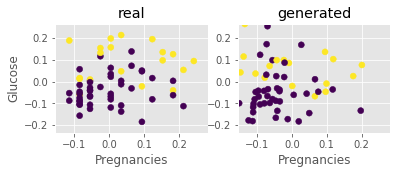

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 0.7017, 0.6882, 0.6890
D Real - D Gen: 0.0007


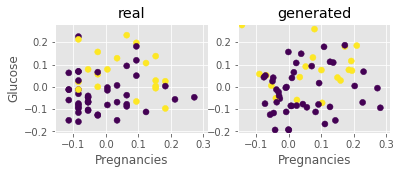

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 0.7045, 0.6849, 0.6886
D Real - D Gen: 0.0037


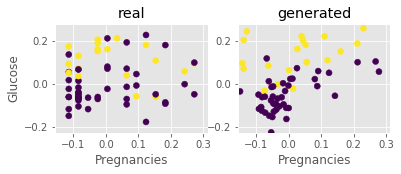

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 0.7061, 0.6832, 0.6884
D Real - D Gen: 0.0052


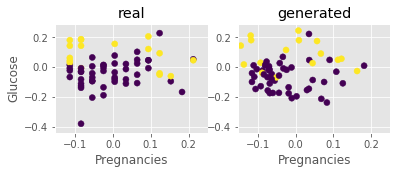

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 0.6992, 0.6863, 0.6900
D Real - D Gen: 0.0037


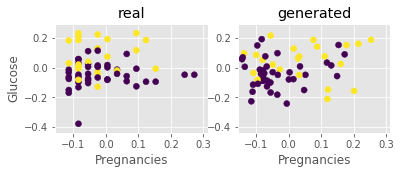

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6813, 0.6935
D Real - D Gen: 0.0122


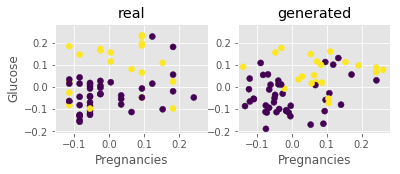

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 0.7050, 0.6864, 0.6933
D Real - D Gen: 0.0069


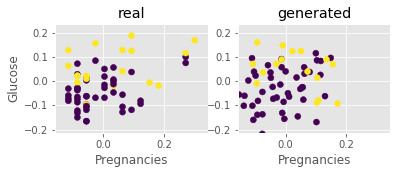

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 0.7036, 0.6811, 0.6873
D Real - D Gen: 0.0062


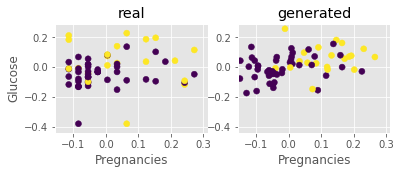

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 0.7005, 0.6795, 0.6881
D Real - D Gen: 0.0086


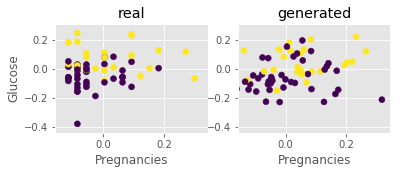

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 0.7008, 0.6859, 0.6861
D Real - D Gen: 0.0003


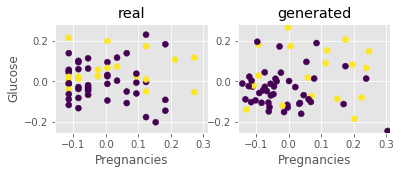

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 0.7023, 0.6840, 0.6886
D Real - D Gen: 0.0046


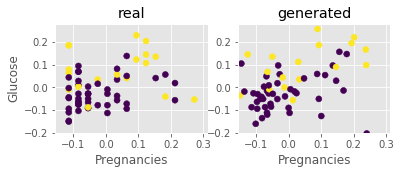

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 0.6989, 0.6863, 0.6909
D Real - D Gen: 0.0045


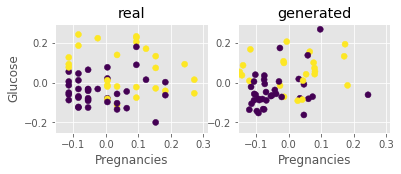

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 0.7063, 0.6795, 0.6934
D Real - D Gen: 0.0139


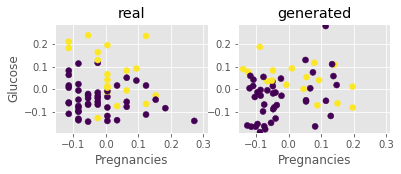

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 0.7027, 0.6794, 0.6879
D Real - D Gen: 0.0085


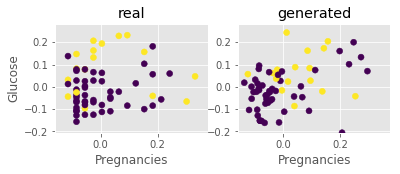

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 0.7011, 0.6795, 0.6861
D Real - D Gen: 0.0066


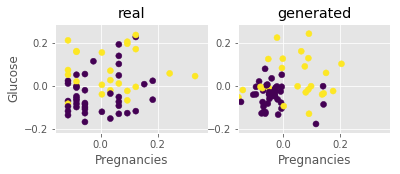

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 0.7073, 0.6846, 0.6883
D Real - D Gen: 0.0037


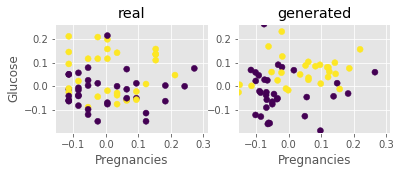

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 0.6982, 0.6839, 0.6801
D Real - D Gen: -0.0038


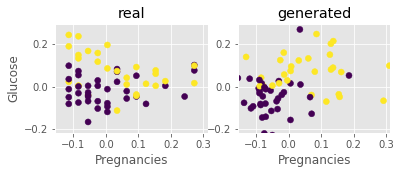

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 0.6949, 0.6892, 0.6823
D Real - D Gen: -0.0069


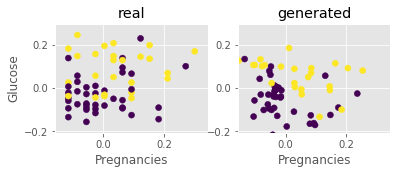

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 0.7020, 0.6931, 0.6858
D Real - D Gen: -0.0072


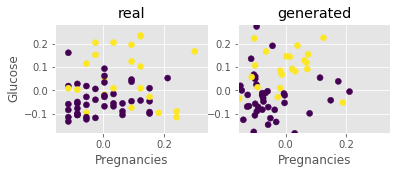

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 0.6952, 0.6910, 0.6811
D Real - D Gen: -0.0099


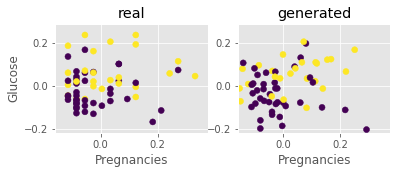

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 0.6909, 0.6927, 0.6887
D Real - D Gen: -0.0040


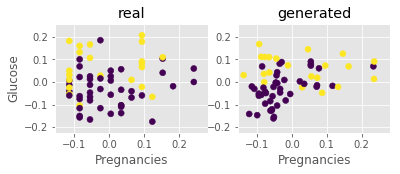

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 0.7050, 0.6810, 0.6839
D Real - D Gen: 0.0030


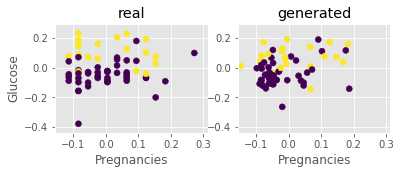

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 0.7090, 0.6796, 0.6934
D Real - D Gen: 0.0137


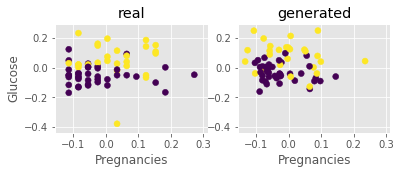

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 0.7031, 0.6810, 0.6903
D Real - D Gen: 0.0094


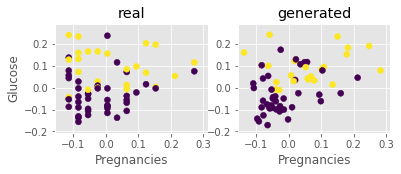

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 0.7059, 0.6777, 0.6866
D Real - D Gen: 0.0089


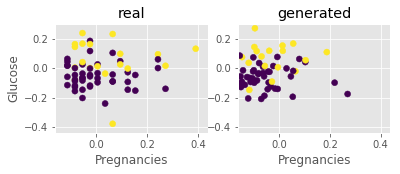

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 0.6991, 0.6853, 0.6873
D Real - D Gen: 0.0020


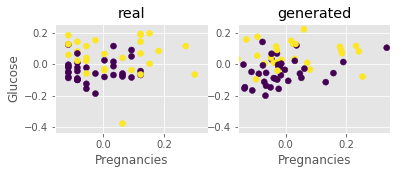

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 0.6985, 0.6806, 0.6812
D Real - D Gen: 0.0006


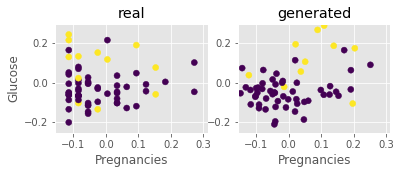

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 0.6996, 0.6826, 0.6839
D Real - D Gen: 0.0013


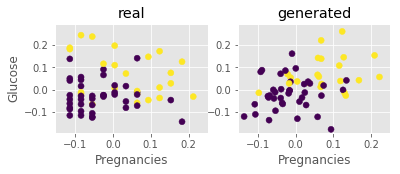

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 0.7013, 0.6870, 0.6898
D Real - D Gen: 0.0029


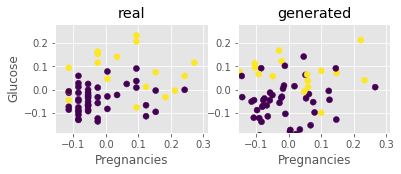

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 0.7013, 0.6908, 0.6721
D Real - D Gen: -0.0187


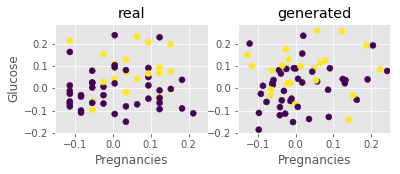

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 0.7008, 0.6894, 0.6803
D Real - D Gen: -0.0090


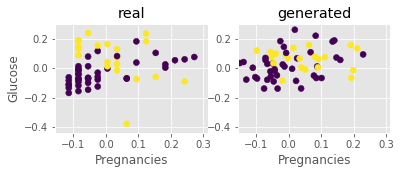

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 0.7038, 0.6786, 0.6848
D Real - D Gen: 0.0062


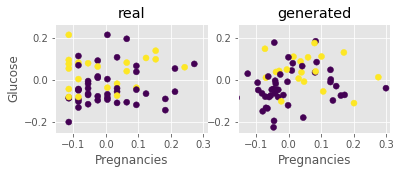

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 0.6972, 0.6816, 0.6895
D Real - D Gen: 0.0079


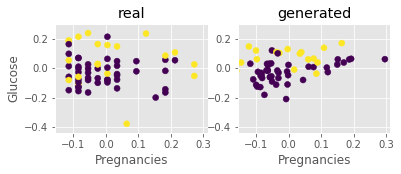

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 0.7043, 0.6811, 0.6787
D Real - D Gen: -0.0023


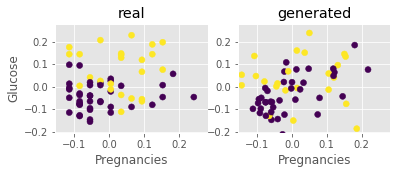

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 0.7022, 0.6814, 0.6920
D Real - D Gen: 0.0107


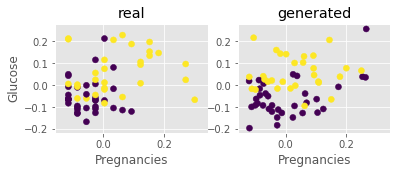

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 0.7012, 0.6850, 0.6748
D Real - D Gen: -0.0102


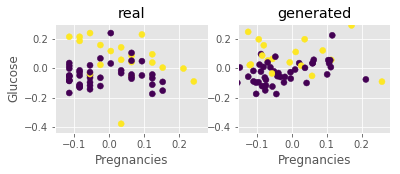

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.6868, 0.6813
D Real - D Gen: -0.0055


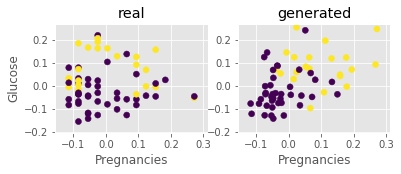

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 0.7037, 0.6807, 0.6812
D Real - D Gen: 0.0005


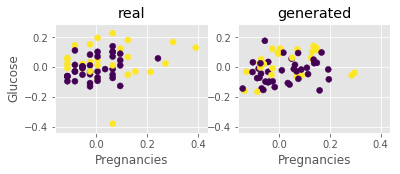

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 0.7019, 0.6785, 0.6823
D Real - D Gen: 0.0037


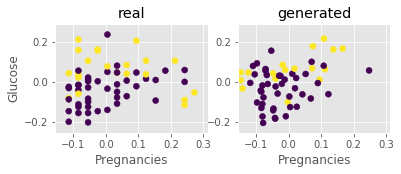

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 0.7051, 0.6791, 0.6739
D Real - D Gen: -0.0052


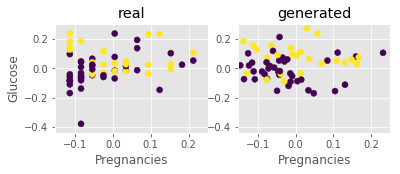

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 0.7031, 0.6799, 0.6858
D Real - D Gen: 0.0060


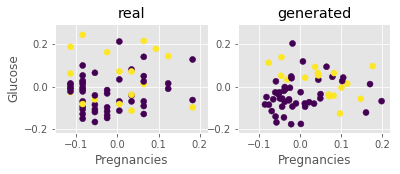

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 0.6978, 0.6838, 0.6835
D Real - D Gen: -0.0003


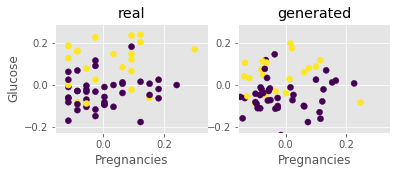

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 0.7143, 0.6767, 0.6910
D Real - D Gen: 0.0143


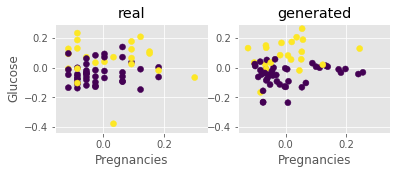

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 0.7147, 0.6794, 0.6866
D Real - D Gen: 0.0072


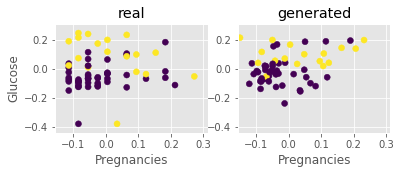

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 0.7030, 0.6713, 0.6889
D Real - D Gen: 0.0177


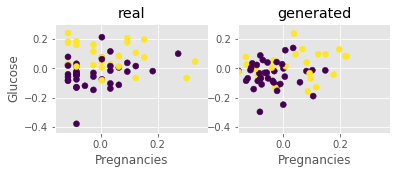

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 0.7096, 0.6803, 0.6876
D Real - D Gen: 0.0073


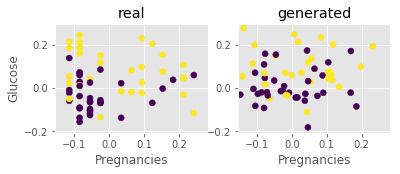

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 0.7036, 0.6820, 0.6885
D Real - D Gen: 0.0065


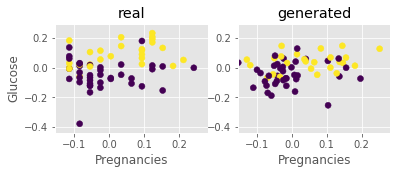

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 0.6942, 0.6827, 0.6825
D Real - D Gen: -0.0003


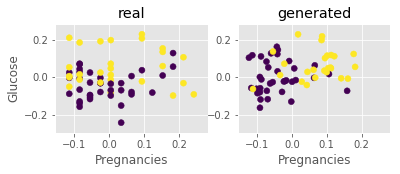

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 0.7021, 0.6862, 0.6849
D Real - D Gen: -0.0014


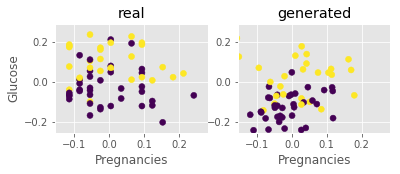

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 0.7015, 0.6848, 0.6785
D Real - D Gen: -0.0063


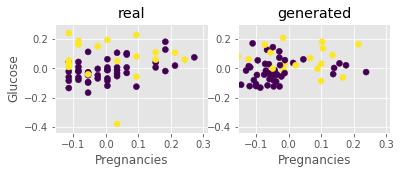

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 0.6970, 0.6841, 0.6735
D Real - D Gen: -0.0107


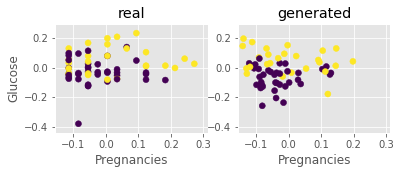

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 0.7130, 0.6685, 0.6944
D Real - D Gen: 0.0258


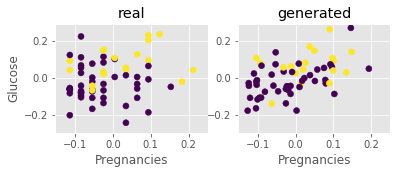

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 0.7041, 0.6767, 0.6862
D Real - D Gen: 0.0095


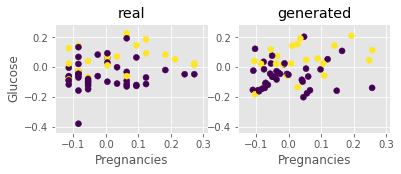

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 0.7016, 0.6841, 0.6815
D Real - D Gen: -0.0026


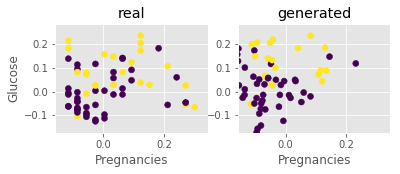

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 0.7061, 0.6760, 0.6846
D Real - D Gen: 0.0087


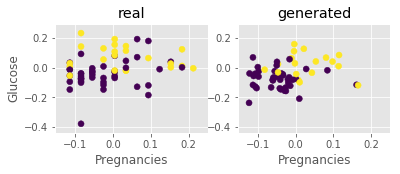

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 0.6993, 0.6834, 0.6753
D Real - D Gen: -0.0081


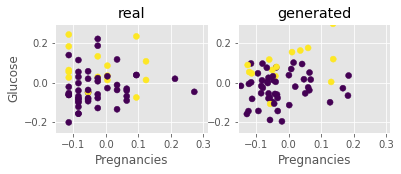

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 0.7003, 0.6783, 0.6860
D Real - D Gen: 0.0078


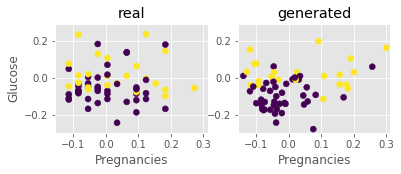

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 0.7097, 0.6771, 0.6857
D Real - D Gen: 0.0086


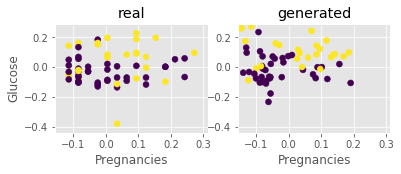

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 0.6987, 0.6856, 0.6811
D Real - D Gen: -0.0045


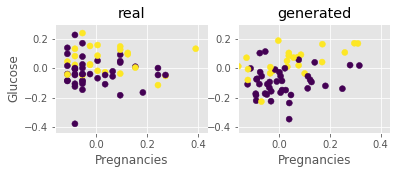

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 0.7022, 0.6856, 0.6865
D Real - D Gen: 0.0009


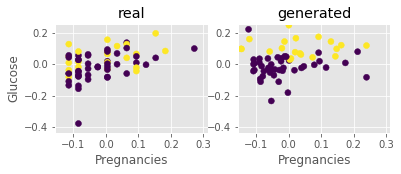

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 0.7103, 0.6802, 0.6854
D Real - D Gen: 0.0052


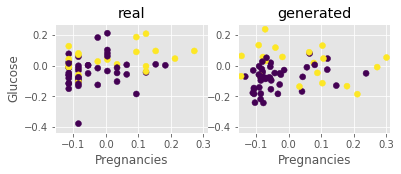

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 0.7010, 0.6858, 0.6794
D Real - D Gen: -0.0064


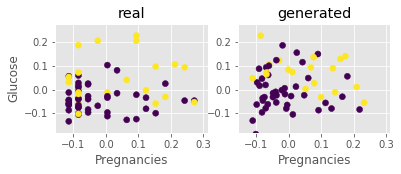

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 0.7032, 0.6767, 0.6816
D Real - D Gen: 0.0048


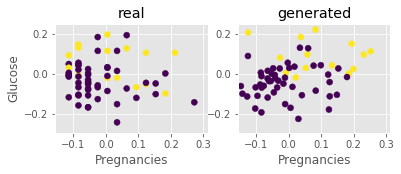

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 0.7048, 0.6766, 0.6796
D Real - D Gen: 0.0030


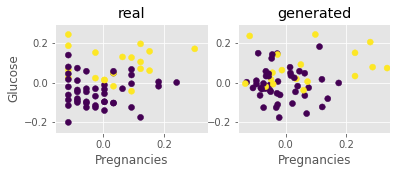

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 0.7049, 0.6840, 0.6758
D Real - D Gen: -0.0082


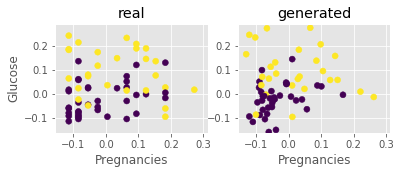

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 0.6996, 0.6720, 0.6829
D Real - D Gen: 0.0109


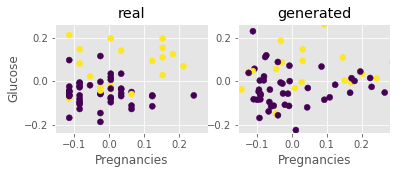

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 0.7110, 0.6810, 0.6831
D Real - D Gen: 0.0021


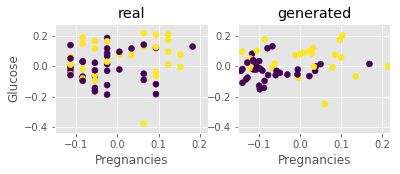

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 0.7019, 0.6921, 0.6773
D Real - D Gen: -0.0148


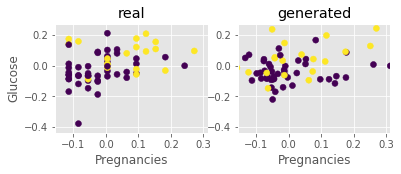

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 0.7001, 0.6902, 0.6675
D Real - D Gen: -0.0228


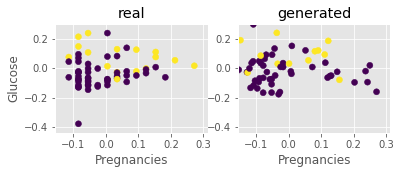

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 0.7146, 0.6760, 0.6800
D Real - D Gen: 0.0039


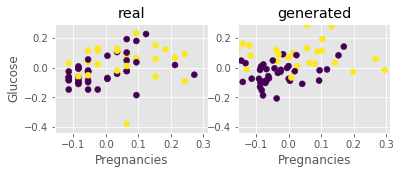

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 0.7070, 0.6894, 0.6791
D Real - D Gen: -0.0102


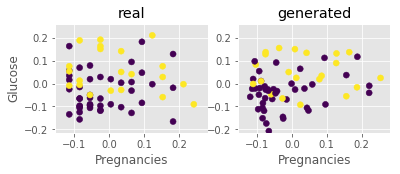

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 0.7032, 0.6908, 0.6819
D Real - D Gen: -0.0089


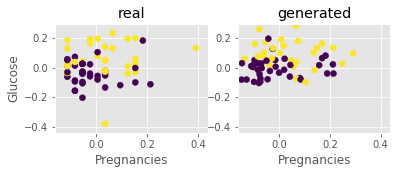

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 0.7061, 0.6872, 0.6733
D Real - D Gen: -0.0138


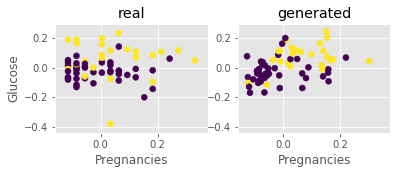

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 0.7027, 0.6840, 0.6795
D Real - D Gen: -0.0045


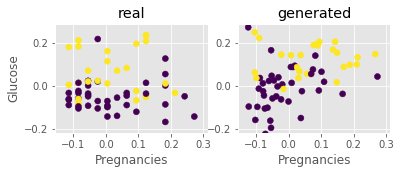

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 0.7092, 0.6704, 0.6806
D Real - D Gen: 0.0101


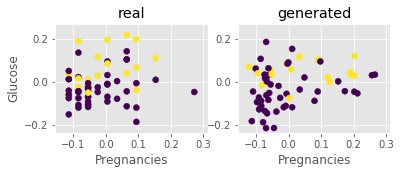

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 0.7196, 0.6839, 0.6791
D Real - D Gen: -0.0048


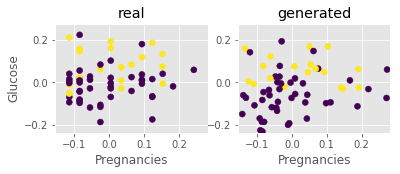

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 0.7118, 0.6854, 0.6764
D Real - D Gen: -0.0090


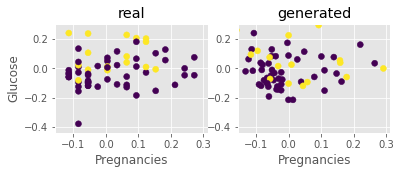

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 0.7016, 0.6711, 0.6806
D Real - D Gen: 0.0095


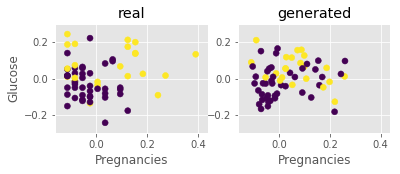

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 0.7208, 0.6664, 0.6885
D Real - D Gen: 0.0221


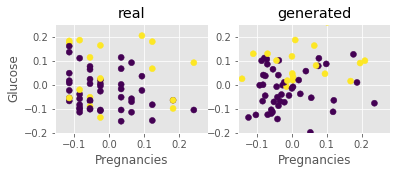

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 0.6995, 0.6792, 0.6799
D Real - D Gen: 0.0007


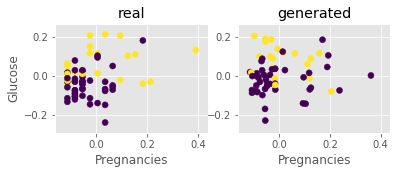

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 0.6908, 0.6834, 0.6843
D Real - D Gen: 0.0009


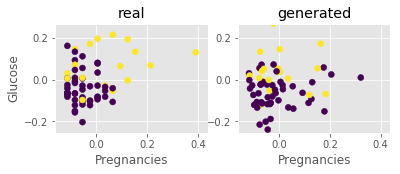

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.6785, 0.6836
D Real - D Gen: 0.0051


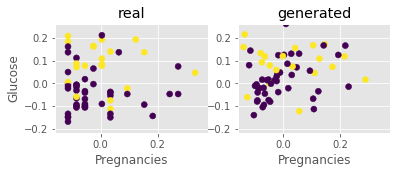

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 0.6962, 0.6856, 0.6706
D Real - D Gen: -0.0150


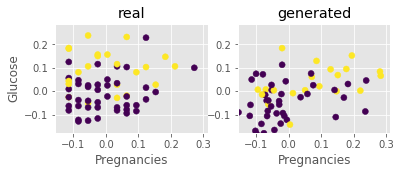

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 0.7003, 0.6832, 0.6920
D Real - D Gen: 0.0089


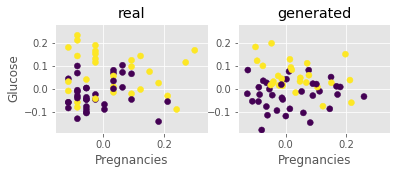

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 0.7223, 0.6722, 0.6720
D Real - D Gen: -0.0002


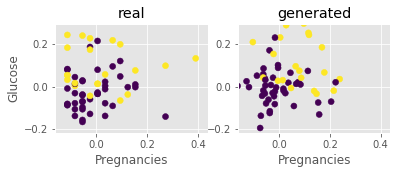

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 0.7077, 0.6703, 0.6838
D Real - D Gen: 0.0135


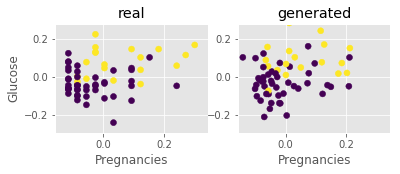

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 0.7091, 0.6662, 0.6868
D Real - D Gen: 0.0206


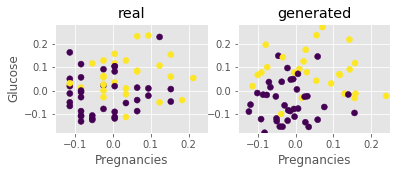

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 0.7090, 0.6762, 0.6714
D Real - D Gen: -0.0048


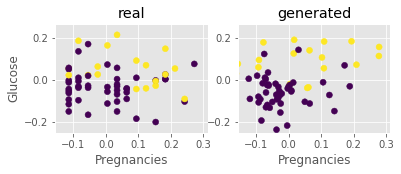

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 0.7021, 0.6787, 0.6701
D Real - D Gen: -0.0086


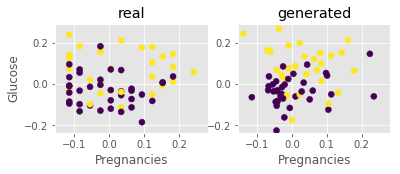

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 0.7065, 0.6705, 0.6731
D Real - D Gen: 0.0027


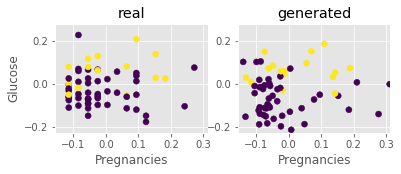

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 0.7205, 0.6762, 0.6807
D Real - D Gen: 0.0045


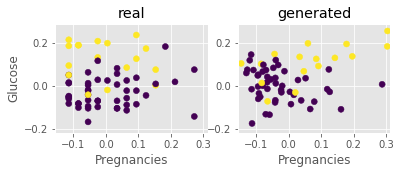

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 0.7011, 0.6861, 0.6670
D Real - D Gen: -0.0191


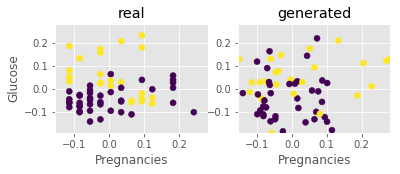

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 0.6989, 0.6647, 0.6817
D Real - D Gen: 0.0171


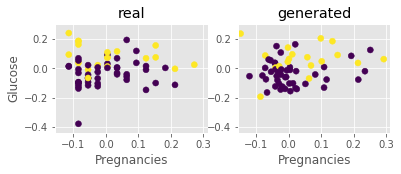

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 0.7113, 0.6738, 0.6844
D Real - D Gen: 0.0106


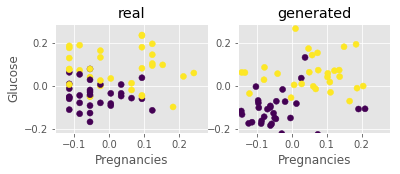

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 0.7023, 0.6722, 0.6803
D Real - D Gen: 0.0082


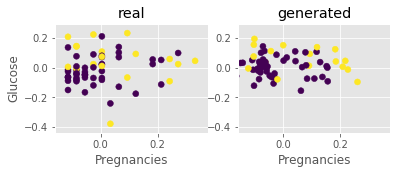

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 0.7010, 0.6831, 0.6775
D Real - D Gen: -0.0056


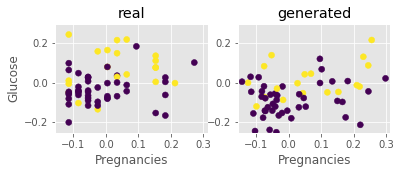

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 0.7165, 0.6761, 0.6798
D Real - D Gen: 0.0037


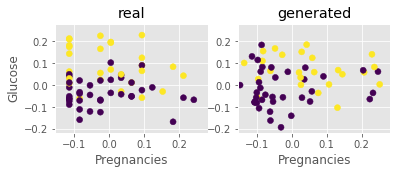

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 0.7102, 0.6808, 0.6818
D Real - D Gen: 0.0009


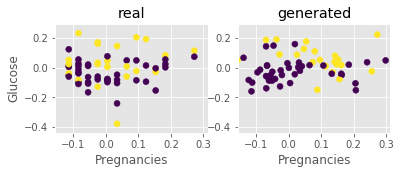

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 0.6979, 0.6834, 0.6815
D Real - D Gen: -0.0018


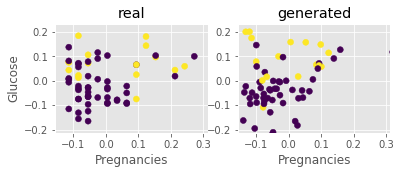

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 0.7134, 0.6836, 0.6802
D Real - D Gen: -0.0034


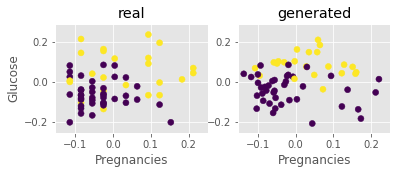

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 0.7038, 0.6995, 0.6762
D Real - D Gen: -0.0233


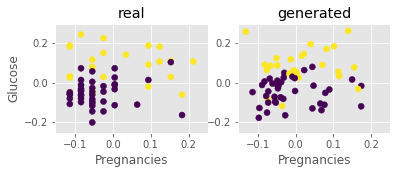

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 0.6943, 0.6777, 0.6700
D Real - D Gen: -0.0078


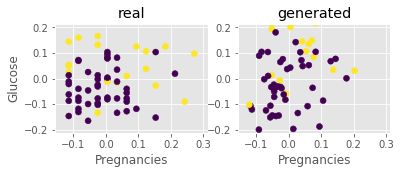

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 0.7184, 0.6710, 0.6791
D Real - D Gen: 0.0080


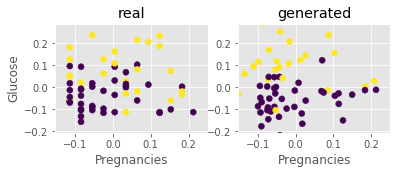

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 0.7148, 0.6788, 0.6873
D Real - D Gen: 0.0084


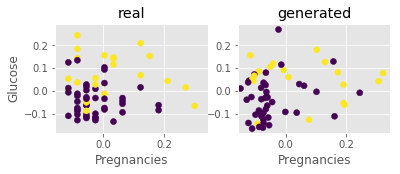

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 0.6959, 0.6768, 0.6800
D Real - D Gen: 0.0032


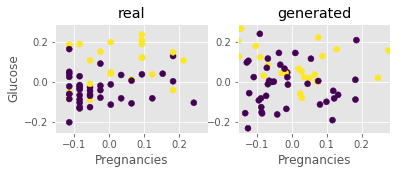

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 0.7183, 0.6800, 0.6788
D Real - D Gen: -0.0012


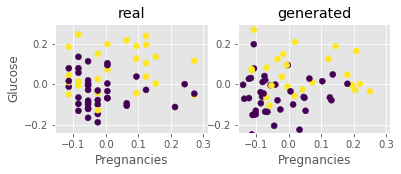

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 0.7114, 0.6762, 0.6771
D Real - D Gen: 0.0009


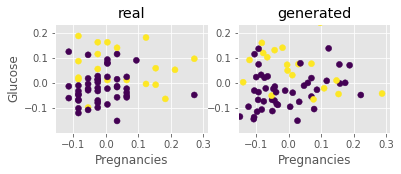

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 0.6965, 0.6773, 0.6917
D Real - D Gen: 0.0144


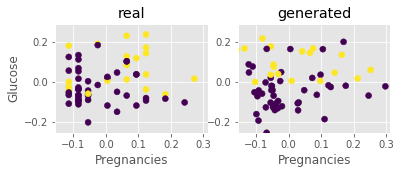

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 0.7063, 0.6745, 0.6818
D Real - D Gen: 0.0073


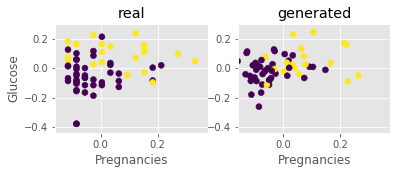

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 0.7073, 0.6708, 0.6693
D Real - D Gen: -0.0015


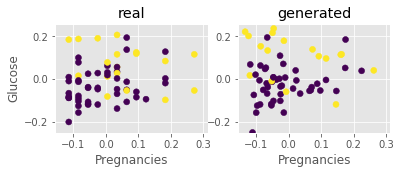

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 0.6954, 0.6794, 0.6734
D Real - D Gen: -0.0060


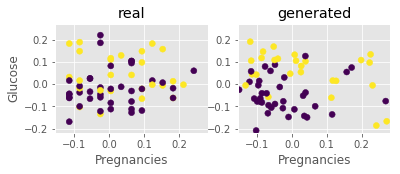

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 0.7143, 0.6738, 0.6778
D Real - D Gen: 0.0041


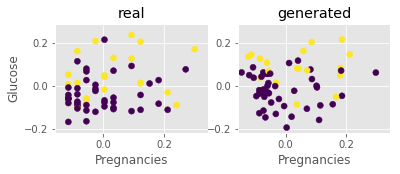

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 0.7029, 0.6711, 0.6782
D Real - D Gen: 0.0071


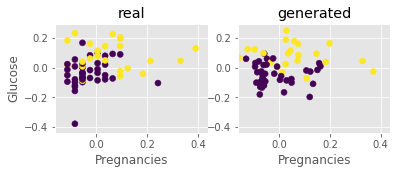

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 0.7012, 0.6915, 0.6690
D Real - D Gen: -0.0225


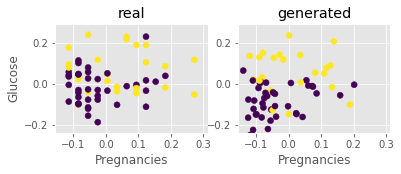

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 0.7196, 0.6683, 0.6718
D Real - D Gen: 0.0034


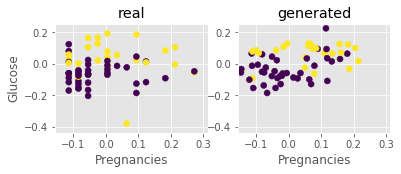

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 0.7095, 0.6795, 0.6594
D Real - D Gen: -0.0201


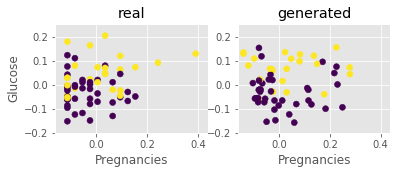

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 0.7127, 0.6753, 0.6815
D Real - D Gen: 0.0062


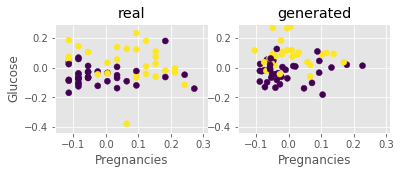

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 0.7187, 0.6809, 0.6693
D Real - D Gen: -0.0117


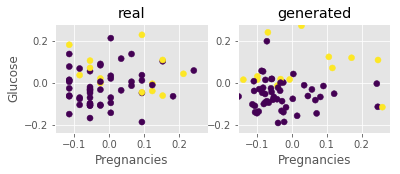

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 0.7215, 0.6698, 0.6946
D Real - D Gen: 0.0248


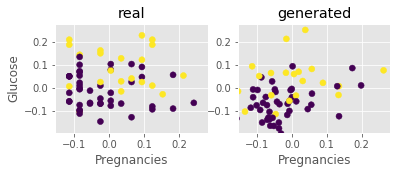

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 0.6945, 0.6888, 0.6725
D Real - D Gen: -0.0162


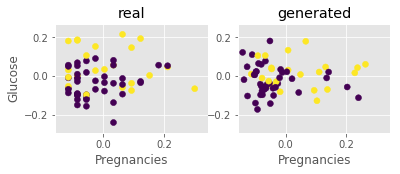

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 0.7081, 0.6789, 0.6849
D Real - D Gen: 0.0060


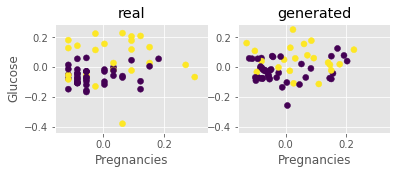

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 0.7158, 0.6602, 0.6860
D Real - D Gen: 0.0259


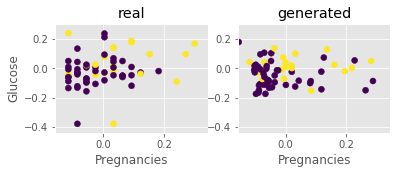

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 0.6964, 0.6790, 0.6703
D Real - D Gen: -0.0088


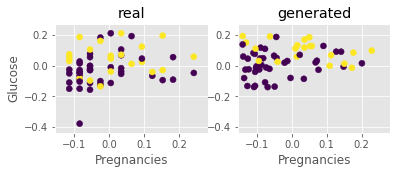

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 0.7164, 0.6711, 0.6806
D Real - D Gen: 0.0095


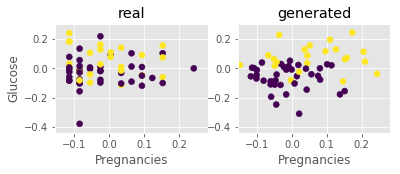

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 0.7122, 0.6784, 0.6762
D Real - D Gen: -0.0022


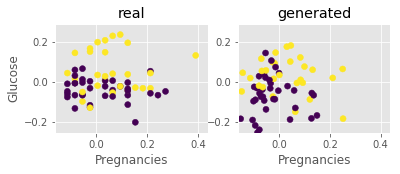

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 0.7059, 0.6574, 0.6827
D Real - D Gen: 0.0254


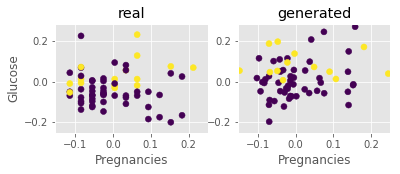

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 0.7034, 0.6693, 0.6616
D Real - D Gen: -0.0077


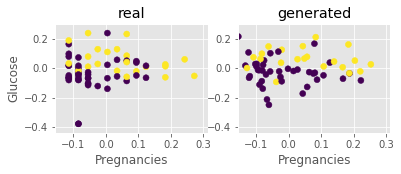

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 0.7054, 0.6736, 0.6870
D Real - D Gen: 0.0134


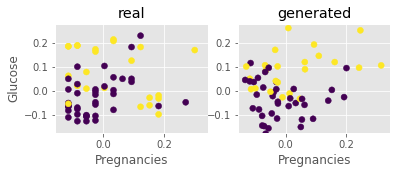

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 0.6978, 0.6734, 0.6715
D Real - D Gen: -0.0019


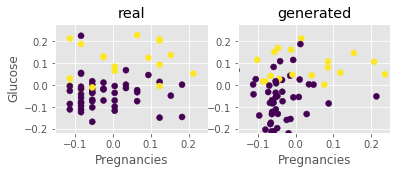

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 0.7061, 0.6827, 0.6815
D Real - D Gen: -0.0012


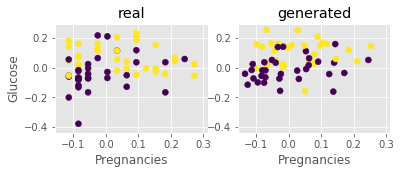

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 0.7142, 0.6765, 0.6634
D Real - D Gen: -0.0131


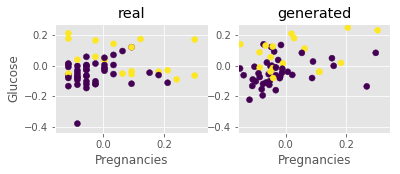

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 0.7043, 0.6762, 0.6684
D Real - D Gen: -0.0078


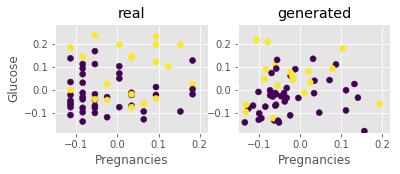

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 0.7138, 0.6656, 0.6779
D Real - D Gen: 0.0123


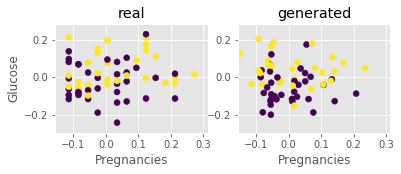

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 0.7102, 0.6796, 0.6669
D Real - D Gen: -0.0127


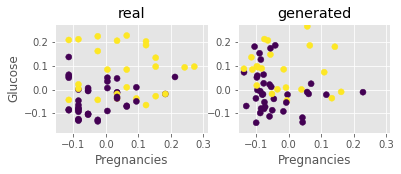

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 0.7001, 0.6778, 0.6638
D Real - D Gen: -0.0140


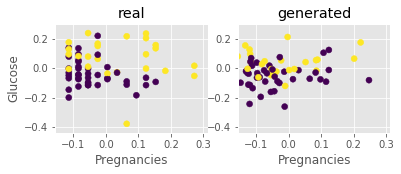

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 0.7109, 0.6761, 0.6694
D Real - D Gen: -0.0067


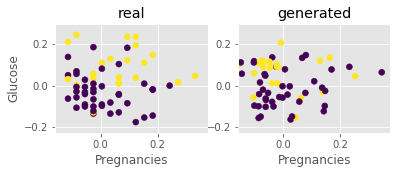

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 0.7046, 0.6810, 0.6834
D Real - D Gen: 0.0024


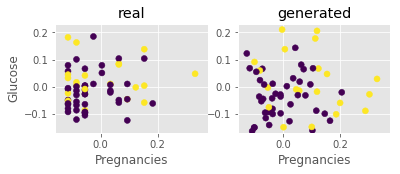

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 0.6937, 0.6608, 0.6742
D Real - D Gen: 0.0134


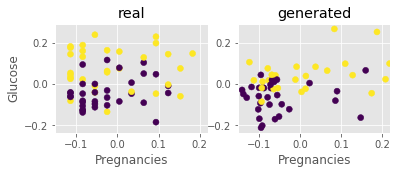

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 0.7131, 0.6674, 0.6840
D Real - D Gen: 0.0166


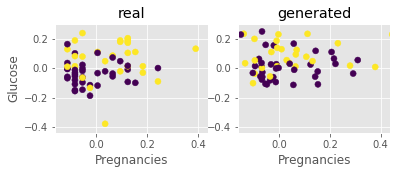

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 0.7171, 0.6777, 0.6805
D Real - D Gen: 0.0028


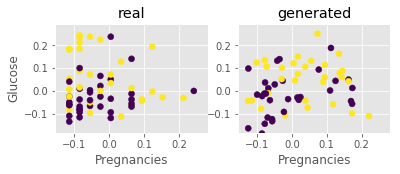

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 0.6960, 0.6821, 0.6729
D Real - D Gen: -0.0093


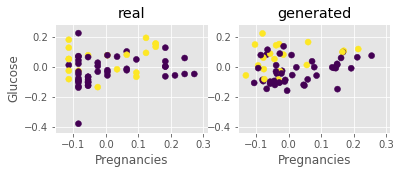

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 0.7145, 0.6627, 0.6787
D Real - D Gen: 0.0160


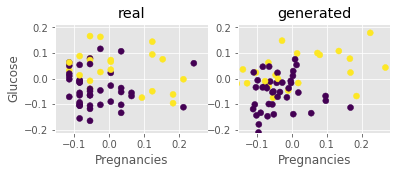

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 0.7243, 0.6650, 0.6778
D Real - D Gen: 0.0128


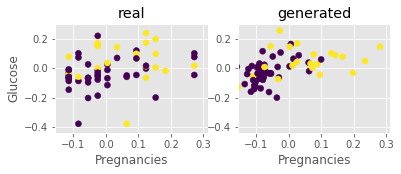

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 0.7166, 0.6720, 0.6894
D Real - D Gen: 0.0174


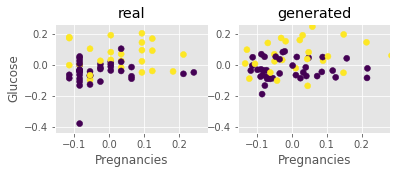

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 0.7100, 0.6797, 0.6758
D Real - D Gen: -0.0040


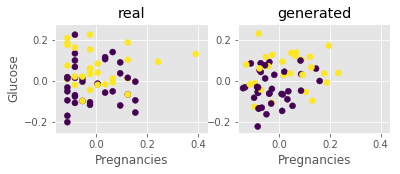

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 0.7049, 0.6798, 0.6667
D Real - D Gen: -0.0132


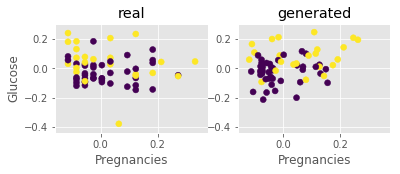

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.6727, 0.6858
D Real - D Gen: 0.0131


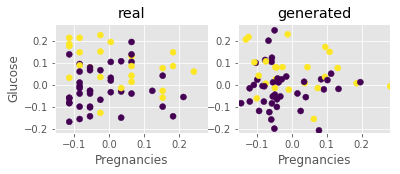

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 0.6936, 0.6726, 0.6587
D Real - D Gen: -0.0139


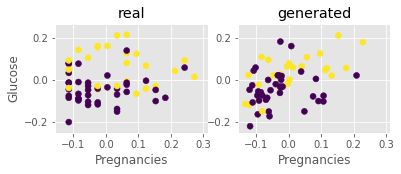

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 0.7148, 0.6793, 0.6951
D Real - D Gen: 0.0159


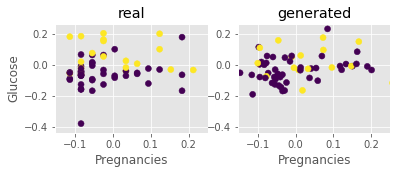

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 0.7076, 0.6743, 0.6641
D Real - D Gen: -0.0102


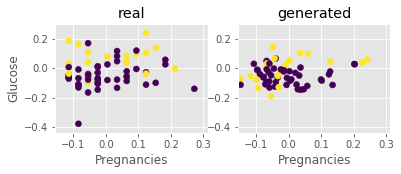

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 0.7124, 0.6746, 0.6640
D Real - D Gen: -0.0106


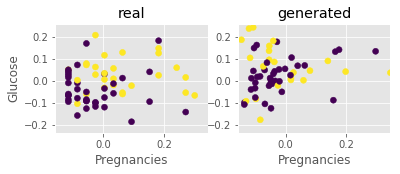

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 0.7025, 0.6752, 0.6788
D Real - D Gen: 0.0036


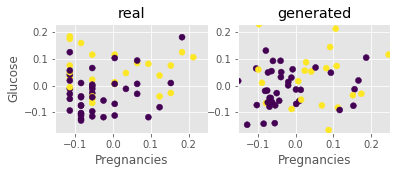

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 0.7118, 0.6690, 0.6779
D Real - D Gen: 0.0089


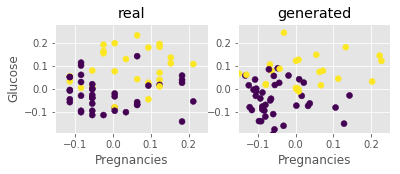

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 0.7195, 0.6728, 0.6778
D Real - D Gen: 0.0050


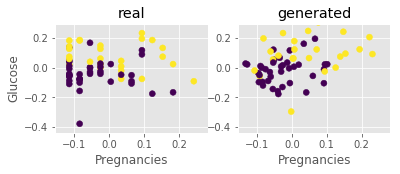

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 0.7215, 0.6831, 0.6829
D Real - D Gen: -0.0002


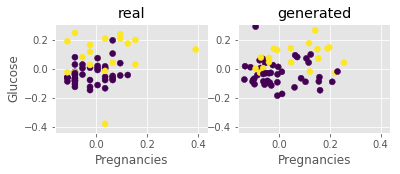

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 0.7049, 0.6661, 0.6733
D Real - D Gen: 0.0072


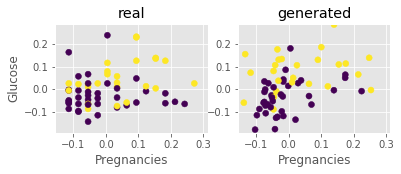

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 0.7150, 0.6578, 0.6688
D Real - D Gen: 0.0111


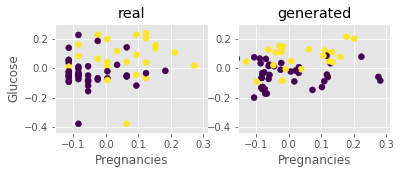

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 0.7082, 0.6802, 0.6572
D Real - D Gen: -0.0230


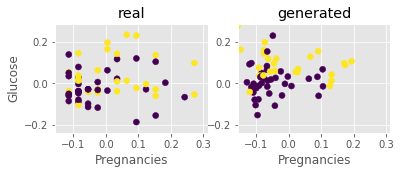

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 0.6957, 0.6727, 0.6667
D Real - D Gen: -0.0060


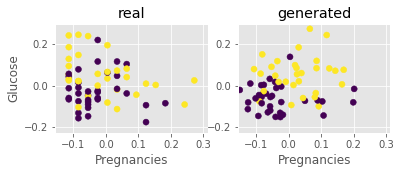

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 0.7172, 0.6778, 0.6717
D Real - D Gen: -0.0061


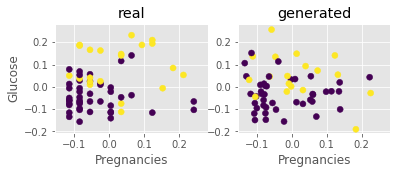

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 0.7102, 0.6825, 0.6884
D Real - D Gen: 0.0059


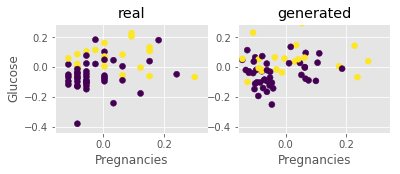

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 0.7230, 0.6872, 0.6745
D Real - D Gen: -0.0127


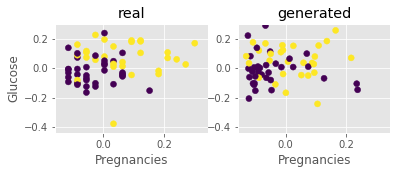

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 0.7327, 0.6662, 0.6795
D Real - D Gen: 0.0133


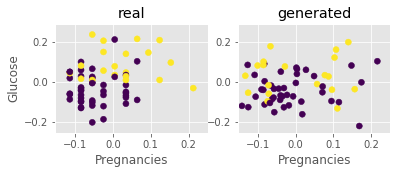

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 0.7176, 0.6817, 0.6685
D Real - D Gen: -0.0132


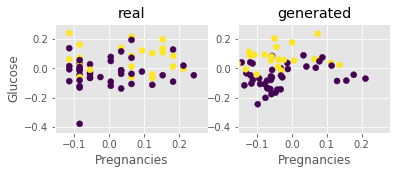

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 0.7000, 0.6531, 0.6820
D Real - D Gen: 0.0289


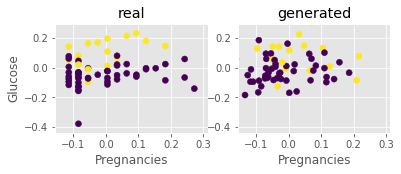

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 0.7248, 0.6557, 0.6741
D Real - D Gen: 0.0184


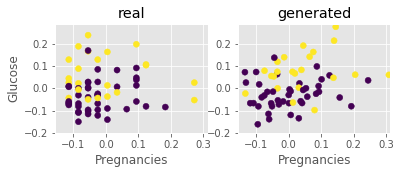

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 0.6977, 0.6755, 0.6609
D Real - D Gen: -0.0146


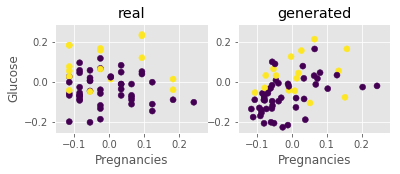

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 0.7066, 0.6888, 0.6716
D Real - D Gen: -0.0172


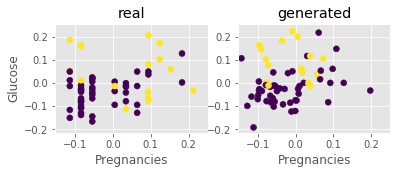

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 0.7215, 0.6759, 0.6871
D Real - D Gen: 0.0112


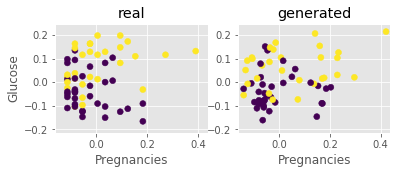

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 0.7011, 0.6851, 0.6607
D Real - D Gen: -0.0243


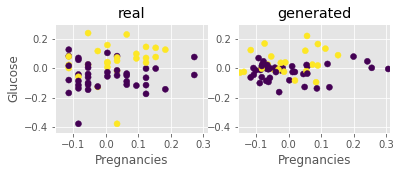

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 0.7064, 0.6712, 0.6594
D Real - D Gen: -0.0118


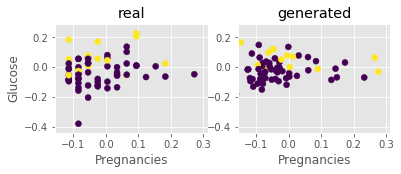

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 0.7162, 0.6712, 0.6788
D Real - D Gen: 0.0076


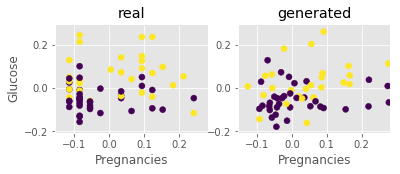

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 0.7120, 0.6654, 0.6768
D Real - D Gen: 0.0114


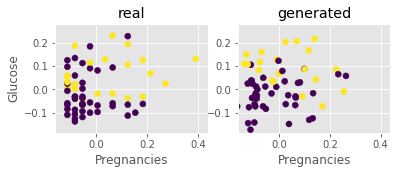

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 0.6990, 0.6762, 0.6639
D Real - D Gen: -0.0123


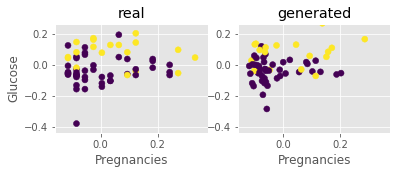

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 0.7352, 0.6646, 0.7002
D Real - D Gen: 0.0356


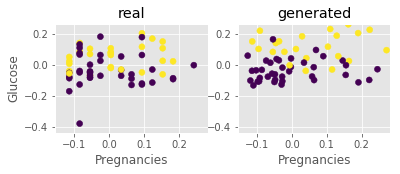

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 0.7336, 0.6823, 0.6695
D Real - D Gen: -0.0127


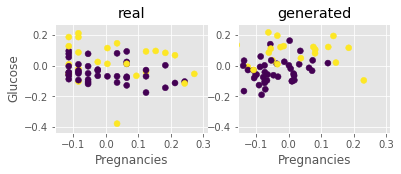

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 0.7230, 0.6806, 0.6735
D Real - D Gen: -0.0071


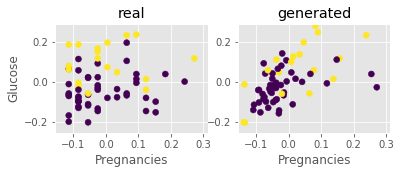

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 0.7272, 0.6712, 0.6678
D Real - D Gen: -0.0034


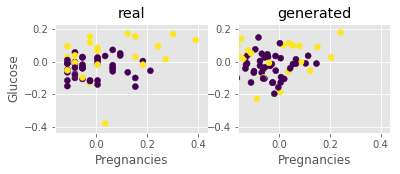

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 0.7090, 0.6556, 0.6855
D Real - D Gen: 0.0298


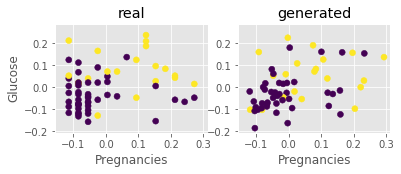

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 0.6992, 0.6751, 0.6864
D Real - D Gen: 0.0113


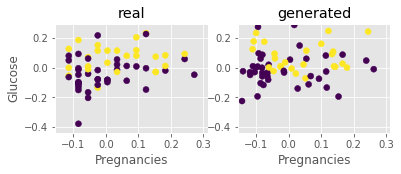

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 0.7144, 0.6772, 0.6826
D Real - D Gen: 0.0054


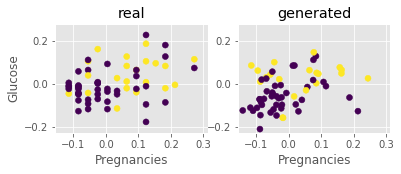

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 0.7272, 0.6637, 0.6820
D Real - D Gen: 0.0184


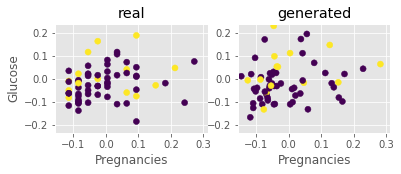

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 0.7048, 0.6667, 0.6838
D Real - D Gen: 0.0171


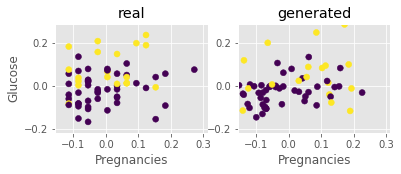

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 0.7204, 0.6615, 0.6627
D Real - D Gen: 0.0012


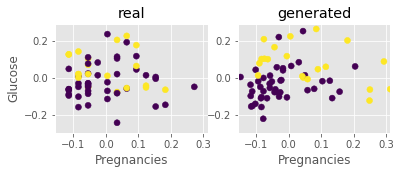

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 0.7129, 0.6824, 0.6817
D Real - D Gen: -0.0007


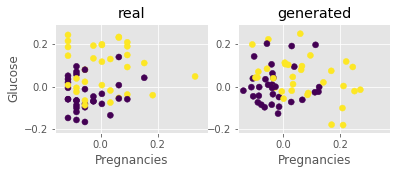

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 0.6920, 0.6801, 0.6831
D Real - D Gen: 0.0030


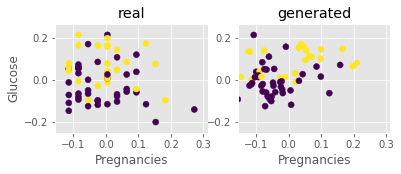

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 0.7609, 0.6743, 0.6730
D Real - D Gen: -0.0012


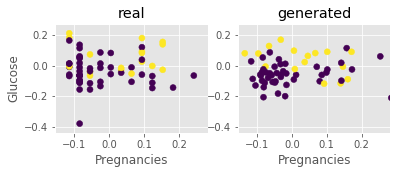

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 0.7162, 0.6547, 0.6758
D Real - D Gen: 0.0211


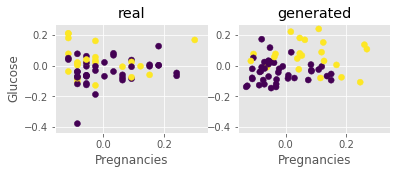

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 0.7001, 0.6790, 0.6660
D Real - D Gen: -0.0130


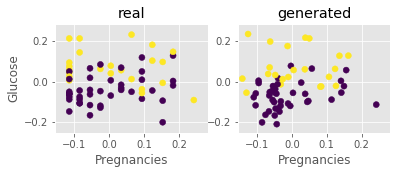

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 0.7209, 0.6683, 0.6569
D Real - D Gen: -0.0114


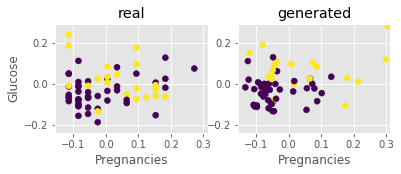

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 0.7081, 0.6580, 0.6774
D Real - D Gen: 0.0194


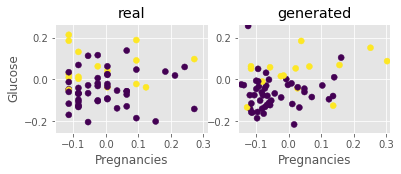

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 0.7029, 0.6800, 0.6748
D Real - D Gen: -0.0052


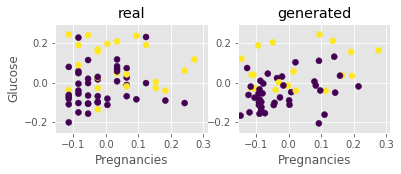

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 0.7393, 0.6611, 0.6692
D Real - D Gen: 0.0081


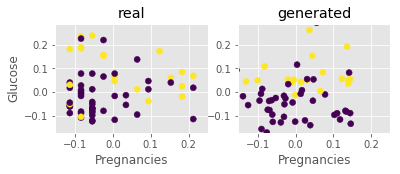

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 0.7046, 0.6743, 0.6880
D Real - D Gen: 0.0137


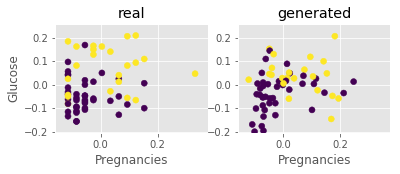

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 0.6973, 0.6707, 0.6749
D Real - D Gen: 0.0042


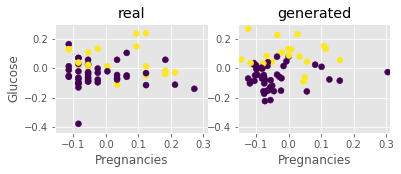

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 0.7668, 0.6577, 0.6779
D Real - D Gen: 0.0203


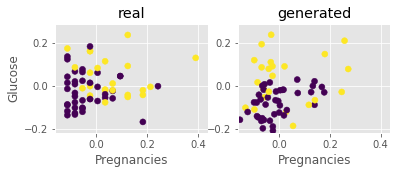

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 0.7044, 0.6821, 0.6755
D Real - D Gen: -0.0066


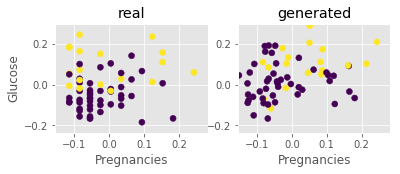

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6813, 0.6569
D Real - D Gen: -0.0245


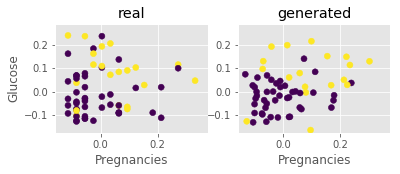

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 0.7293, 0.6665, 0.6638
D Real - D Gen: -0.0027


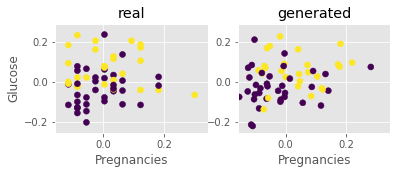

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 0.7073, 0.6797, 0.6809
D Real - D Gen: 0.0013


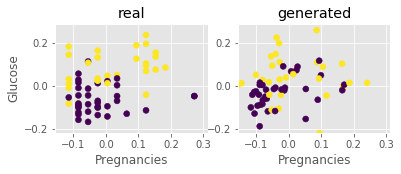

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 0.6886, 0.6719, 0.6729
D Real - D Gen: 0.0010


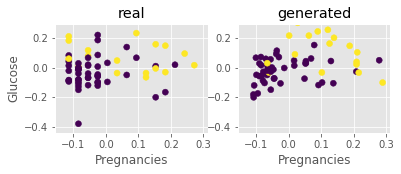

Wall time: 11min 51s


In [22]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [21]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100 
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/diabetes/CGAN_generator_model_weights_step_50000.h5')


In [30]:
# Now generate some new data    
test_size = 768 
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = data[label_cols]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [31]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

real_samples.to_excel('./data/diabetes/real.xlsx')
fake_samples.to_excel('./data/diabetes/fake.xlsx')

In [3]:
real_samples = pd.read_excel('./data/diabetes/real.xlsx')
fake_samples = pd.read_excel('./data/diabetes/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [4]:
pearson = real_samples.corrwith(fake_samples)
pearson.to_excel('./res.xlsx')
pearson

Unnamed: 0                  1.000000
Pregnancies                 0.016169
Glucose                     0.210608
BloodPressure               0.001669
SkinThickness               0.039936
Insulin                    -0.013769
BMI                         0.107534
DiabetesPedigreeFunction    0.084281
Age                         0.071032
Outcome                     1.000000
dtype: float64

## Covariance

In [36]:
columnas = real_samples.columns.values
covarianza = []
for col in columnas:
    covarianza.append(np.cov(real_samples[col], fake_samples[col])[0][1])
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    
pd.Series(covarianza).to_excel('./res.xlsx')
    

Pregnancies:       0.0016255756534273099
Glucose:       0.019861984075480316
BloodPressure:       0.00016429759844234173
SkinThickness:       0.004448796854540388
Insulin:       -0.001345560403920505
BMI:       0.011178232534281648
DiabetesPedigreeFunction:       0.007749911515524591
Age:       0.007445257549408038
Outcome:       0.22748261625380337


## Spearman's Correlation

In [37]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
spearman = []
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    spearman.append(spr)
    print(col + ":       " + str(spr) )
    
pd.Series(spearman).to_excel('./res.xlsx')

Pregnancies:       0.019148304664459735
Glucose:       0.20052636155605996
BloodPressure:       0.0831515249900407
SkinThickness:       0.05762880432361728
Insulin:       -0.02143028458179656
BMI:       0.10623558705775336
DiabetesPedigreeFunction:       0.0607684771030964
Age:       0.11040497295436778
Outcome:       1.0


# XGBoost

## CV with real data

In [20]:
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.7656820303879128
F1-Score XGBoost CV:  0.6459643958047878
ROC AUC XGBoost CV:  0.8294800838574424


## CV with generated data

In [30]:
# Generated data
X = fake_samples.drop(columns=["Outcome"])
y = fake_samples["Outcome"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.8268398268398268
F1-Score XGBoost CV:  0.7368406092326647
ROC AUC XGBoost CV:  0.895004891684137


## CV with the two datasets joined

In [31]:
from sklearn.utils import shuffle
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/diabetes/real_fake.xlsx')

In [32]:
xgbo_cv(data.drop(columns=['Outcome']), data.Outcome.values.ravel())

Accuracy XGBoost CV:  0.7857946613646939
F1-Score XGBoost CV:  0.673872862639367
ROC AUC XGBoost CV:  0.8441275527864314
